## Community Detection in Graphs

This notebook explores various community detection algorithms applied to graphs. The goal is to compare the effectiveness of different methods, analyze the structure of detected communities, and gain insights into graph-based clustering techniques.

---

### Table of Contents

1. [Introduction](#introduction)
2. [Data Loading and Preparation](#data-loading-and-preparation)
3. [LeidenAlg Temporal Community Detection](#leidenalg-temporal-community-detection)
4. [GCN Community Detection](#gcn-community-detection)
5. [Greedy Modularity Communities](#greedy-modularity-communities)
6. [Louvain Communities](#louvain-communities)
7. [GCNConv Communities](#gcnconv-communities)
8. [Blockmodel Communities](#blockmodel-communities)


In [1]:
# General Utilities
import math
import os
import warnings
from itertools import product
from pathlib import Path

# Data Handling and Processing
import numpy as np
import pandas as pd
from scipy.stats import gaussian_kde
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# Network Analysis
import networkx as nx
import networkx_temporal as tx
from community import community_louvain
from networkx.algorithms.community import greedy_modularity_communities
from sklearn.metrics import normalized_mutual_info_score
import leidenalg as la
import igraph as ig

# Visualization
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import seaborn as sns

# Machine Learning and Graph Neural Networks
import torch
import torch.nn.functional as F
from torch import nn
from torch_geometric.data import Data
from torch_geometric.nn import GAE, GCNConv
from torch_geometric.utils import to_undirected
import umap.umap_ as umap

# Custom Modules
from dataloader import DataLoader

# Set global visualization and warning options
warnings.filterwarnings("ignore")

C:\Users\sandr\UntrackedFolder\NetworkScienceProject\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Data Loading and Preparation

In [2]:
# Load and preprocess dataset
hs_code = 282520
hs_label = "Lithium"

In [3]:
# Create dir for exporting plots
export_path = os.path.join("figures", hs_label)
Path(export_path).mkdir(parents=True, exist_ok=True)

In [4]:
# Load and preprocess dataset
loader = DataLoader(hs_code=hs_code)

_initialize_data took 51.3119 seconds


In [5]:
# Returns pandas dataframe of polar dataframe
df = loader.get_data()

In [6]:
# Extracts the distinct years
years = sorted(df['t'].unique())

In [7]:
# Get aggregated export and import over all products
baseline_df = loader.get_baseline(load_precompute=True)

In [8]:
# Get Networkx representation of baseline_df
yearly_graphs = loader.get_yearly_graphs(years)

In [9]:
yearly_baseline_graph = loader.get_yearly_baseline_graphs(baseline_df, years)

In [10]:
df

,t,i,j,k,v,q,export_country,import_country,description,iso3_o,...,tradeflow_imf_d,comlang_ethno,comcol,col45,comleg_pretrans,comleg_posttrans,col_dep_ever,empire,sibling_ever,scaled_sci_2021
0,2002,36,124,282520,7.627,2.211,Australia,Canada,Lithium oxide and hydroxide,AUS,...,1151881.5,1.0,0.0,0.0,1.0,1.0,0.0,,1.0,19159.0
1,2002,36,360,282520,15.395,1.120,Australia,Indonesia,Lithium oxide and hydroxide,AUS,...,1814127.625,0.0,0.0,0.0,0.0,0.0,0.0,,0.0,NaN
2,2002,36,372,282520,1.874,0.008,Australia,Ireland,Lithium oxide and hydroxide,AUS,...,109872.336,1.0,0.0,0.0,1.0,1.0,0.0,,1.0,61908.0
3,2002,36,380,282520,2.748,0.003,Australia,Italy,Lithium oxide and hydroxide,AUS,...,1230163.625,0.0,0.0,0.0,0.0,0.0,0.0,,0.0,7123.0
4,2002,36,554,282520,5.832,1.422,Australia,New Zealand,Lithium oxide and hydroxide,AUS,...,3335579.5,1.0,0.0,0.0,1.0,1.0,0.0,,1.0,247952.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10856,2022,842,757,282520,94.439,1.124,United States of America,Switzerland,Lithium oxide and hydroxide,None,...,None,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN
10857,2022,842,764,282520,6188.819,89.237,United States of America,Thailand,Lithium oxide and hydroxide,None,...,None,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN
10858,2022,842,784,282520,2476.180,87.011,United States of America,United Arab Emirates,Lithium oxide and hydroxide,None,...,None,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN
10859,2022,842,792,282520,0.873,0.045,United States of America,Turkey,Lithium oxide and hydroxide,None,...,None,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN


In [11]:
baseline_df

,t,import_country,export_country,v
0,2001,Afghanistan,Australia,319.378
1,2001,Afghanistan,Austria,142.477
2,2001,Afghanistan,Azerbaijan,190.776
3,2001,Afghanistan,Bahrain,4.266
4,2001,Afghanistan,Bangladesh,6008.931
...,...,...,...,...
672029,2022,Zimbabwe,United Kingdom,85564.157
672030,2022,Zimbabwe,United Rep. of Tanzania,15260.089
672031,2022,Zimbabwe,Uruguay,220.626
672032,2022,Zimbabwe,Viet Nam,251.952


### LeidenAlg Temporal Community Detection

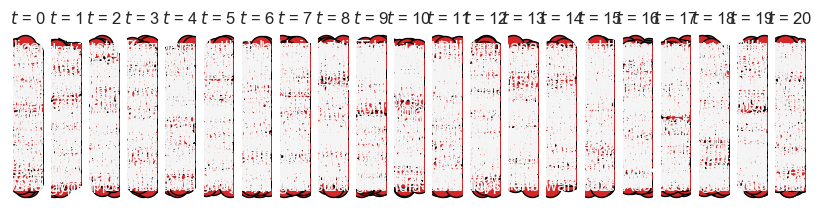

In [12]:
TG = tx.TemporalMultiDiGraph()

for year, G in yearly_graphs.items():
    for u, v, data in G.edges(data=True):
        TG.add_edge(u, v, time=year, **data)

TG = TG.slice(attr="time")

tx.draw(TG, figsize=(8, 2))


In [13]:
snapshots = TG.to_snapshots("igraph")

temporal_membership, improvement = la.find_partition_temporal(
    snapshots,
    la.ModularityVertexPartition,
    interslice_weight=5,
    n_iterations=-1,
    seed=42,
    vertex_id_attr="_nx_name",
    weight_attr="inverse_weight"
)

cmap = plt.cm.get_cmap("tab10")
max_community = max(max(membership) for membership in temporal_membership)  # No .values()
community_colors = {i: mcolors.to_hex(cmap(i / max_community)) for i in range(max_community + 1)}


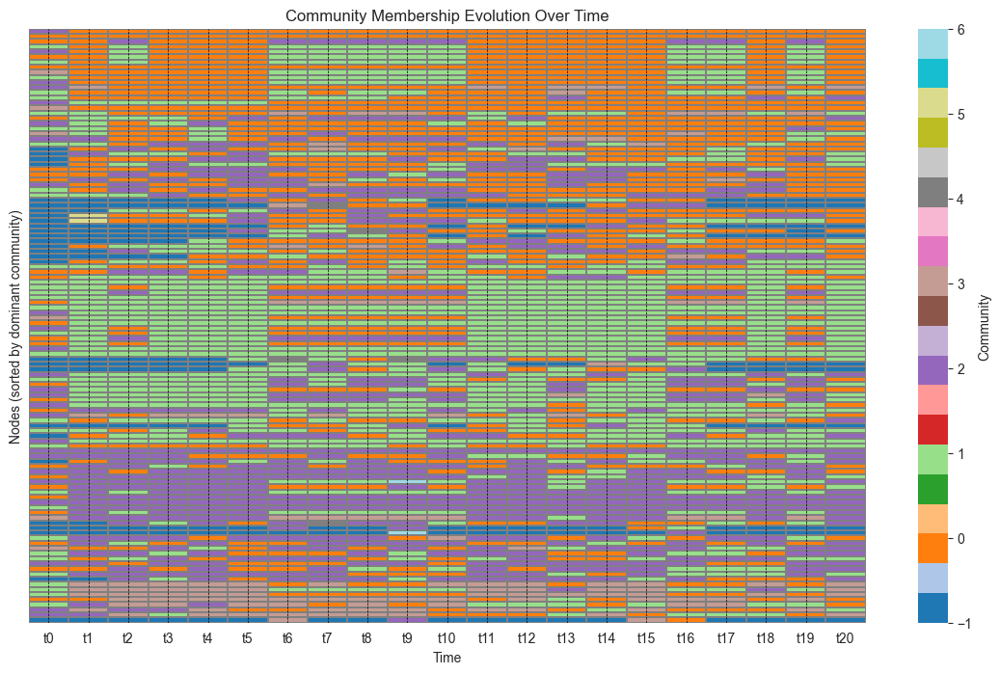

In [14]:
all_nodes = set()
for membership in temporal_membership:
    all_nodes.update(range(len(membership)))

all_nodes = sorted(all_nodes)
node_to_index = {node: i for i, node in enumerate(all_nodes)}

node_community_matrix = np.full((len(all_nodes), len(temporal_membership)), -1)

for t, membership in enumerate(temporal_membership):
    for node, community in enumerate(membership):
        node_community_matrix[node_to_index[node], t] = community

dominant_communities = np.array([np.bincount(row[row >= 0]).argmax() for row in node_community_matrix])
sorted_indices = np.argsort(dominant_communities)
sorted_matrix = node_community_matrix[sorted_indices]

plt.figure(figsize=(14, 8))
sns.heatmap(
    sorted_matrix,
    cmap="tab20",
    cbar_kws={"label": "Community"},
    xticklabels=[f"t{t}" for t in range(len(temporal_membership))],
    yticklabels=False,
    linewidths=0.1,
    linecolor="gray",
)

plt.xlabel("Time")
plt.ylabel("Nodes (sorted by dominant community)")
plt.title("Community Membership Evolution Over Time")

num_time_slices = len(temporal_membership)
for t in range(num_time_slices - 1):
    plt.axvline(t + 0.5, color="black", linestyle="--", linewidth=0.5)

plt.savefig(
    os.path.join(export_path, f"{hs_label}_temp_community_heatmap.png"),
    dpi=300,
    transparent=True
)
plt.show()


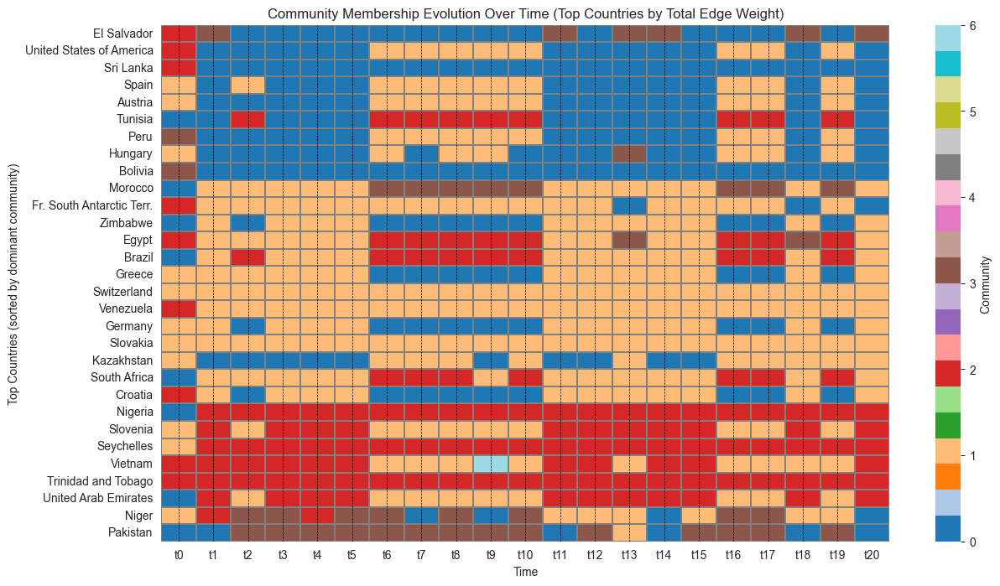

In [15]:
node_to_country = {v.index: v["_nx_name"] for v in snapshots[0].vs}

node_weights = {}

for t, snapshot in enumerate(snapshots):
    for edge in snapshot.es:
        source = edge.source
        target = edge.target
        weight = edge["inverse_weight"] if "inverse_weight" in edge.attributes() else 0
        node_weights[source] = node_weights.get(source, 0) + weight
        node_weights[target] = node_weights.get(target, 0) + weight

top_n = 30
most_relevant_nodes = sorted(node_weights, key=node_weights.get, reverse=True)[:top_n]
most_relevant_countries = [node_to_country[node] for node in most_relevant_nodes]
most_relevant_indices = {node: idx for idx, node in enumerate(most_relevant_nodes)}

node_community_matrix_relevant = np.full((len(most_relevant_nodes), len(temporal_membership)), -1)

for t, membership in enumerate(temporal_membership):
    for node, community in enumerate(membership):
        if node in most_relevant_indices:
            node_community_matrix_relevant[most_relevant_indices[node], t] = community

dominant_communities_relevant = np.array([
    np.bincount(row[row >= 0]).argmax() if len(row[row >= 0]) > 0 else -1
    for row in node_community_matrix_relevant
])
sorted_indices_relevant = np.argsort(dominant_communities_relevant)
sorted_matrix_relevant = node_community_matrix_relevant[sorted_indices_relevant]

plt.figure(figsize=(14, 8))
sns.heatmap(
    sorted_matrix_relevant,
    cmap="tab20",
    cbar_kws={"label": "Community"},
    xticklabels=[f"t{t}" for t in range(len(temporal_membership))],
    yticklabels=[most_relevant_countries[i] for i in sorted_indices_relevant],
    linewidths=0.1,
    linecolor="gray",
)

plt.xlabel("Time")
plt.ylabel("Top Countries (sorted by dominant community)")
plt.title("Community Membership Evolution Over Time (Top Countries by Total Edge Weight)")

num_time_slices = len(temporal_membership)
for t in range(num_time_slices - 1):
    plt.axvline(t + 0.5, color="black", linestyle="--", linewidth=0.5)
plt.savefig(os.path.join(export_path, f"{hs_label}_heatmap_top_countries.png"), dpi=300, bbox_inches="tight", format="png")
plt.show()

### GCN Community Detection

In [16]:
###################################################
# Parameters
###################################################
start_year = 2005
end_year = 2022
window_size = 3
epochs = 50
lr = 0.01
embedding_dim = 32
hidden_dim = 64

In [17]:
# DEVICE
if torch.backends.mps.is_available():
    device = torch.device("mps")
elif torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
print(f"Using device: {device}")

###################################################
# Load and Filter Data
###################################################
years_of_interest = [y for y in years if start_year <= y <= end_year]

if len(years_of_interest) < 2:
    raise ValueError("Not enough years of data for temporal analysis.")

all_countries = np.union1d(df['export_country'].unique(), df['import_country'].unique())
country_to_id = {c: i for i, c in enumerate(all_countries)}
num_nodes = len(all_countries)

Using device: cpu


In [18]:
###################################################
# Node Feature Builder
###################################################
def build_node_features_for_year(year_data, all_countries):
    # If GDP features not available, use zero features
    if 'gdpcap_o' not in year_data.columns or 'gdpcap_d' not in year_data.columns:
        node_features = np.zeros((len(all_countries), 2))
        return torch.tensor(node_features, dtype=torch.float)

    export_gdp = year_data.groupby("export_country")["gdpcap_d"].mean().to_dict()
    import_gdp = year_data.groupby("import_country")["gdpcap_o"].mean().to_dict()

    node_features = []
    for c in all_countries:
        gdp_o_val = import_gdp.get(c, 0.0)
        gdp_d_val = export_gdp.get(c, 0.0)
        node_features.append([gdp_o_val, gdp_d_val])
    return torch.tensor(node_features, dtype=torch.float)

In [19]:
###################################################
# Graph Snapshots for each Year
###################################################
edge_feature_cols = ["v"]
scaler = StandardScaler()
all_edge_attrs = df[edge_feature_cols].fillna(0.0)
scaler.fit(all_edge_attrs)

def build_graph_for_year(year):
    year_df = df[df['t'] == year]
    if year_df.empty:
        return Data(x=torch.zeros((num_nodes,2)), edge_index=torch.empty((2,0), dtype=torch.long))

    x = build_node_features_for_year(year_df, all_countries)
    src = year_df['export_country'].map(country_to_id)
    dst = year_df['import_country'].map(country_to_id)
    edge_index = torch.tensor([src.values, dst.values], dtype=torch.long)

    attrs = year_df[edge_feature_cols].fillna(0.0).values
    attrs = scaler.transform(attrs)
    edge_attr = torch.tensor(attrs, dtype=torch.float)

    data = Data(x=x, edge_index=edge_index, edge_attr=edge_attr)
    return data

year_graphs = []
for y in years_of_interest:
    data_y = build_graph_for_year(y)
    year_graphs.append((y, data_y))

In [20]:
###################################################
# GCN Encoder
###################################################
class GCNEncoder(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super().__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv2 = GCNConv(hidden_channels, out_channels)

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = self.conv2(x, edge_index)
        return x

In [21]:
###################################################
# Training for Yearly Embeddings
###################################################
year_embeddings = {}

for y, data_y in year_graphs:
    data_y = data_y.to(device)
    encoder = GCNEncoder(in_channels=data_y.x.size(1),
                         hidden_channels=hidden_dim,
                         out_channels=embedding_dim)
    model = GAE(encoder=encoder).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    rev_edge_index = torch.stack([data_y.edge_index[1], data_y.edge_index[0]], dim=0)
    full_edge_index = torch.cat([data_y.edge_index, rev_edge_index], dim=1)
    data_y.edge_index = full_edge_index

    model.train()
    for epoch in range(epochs):
        optimizer.zero_grad()
        z = model.encode(data_y.x, data_y.edge_index)
        loss = model.recon_loss(z, data_y.edge_index)
        loss.backward()
        optimizer.step()

    model.eval()
    with torch.no_grad():
        z = model.encode(data_y.x, data_y.edge_index)
    year_embeddings[y] = z.cpu().numpy()

In [22]:
###################################################
# Sliding Window Analysis of Network Structure
###################################################
def build_nx_graph_from_edges(edge_index):
    G = nx.Graph()
    G.add_nodes_from(range(num_nodes))
    for j in range(edge_index.size(1)):
        u = edge_index[0, j].item()
        v = edge_index[1, j].item()
        G.add_edge(u, v)
    return G

window_metrics = []
for i in range(len(years_of_interest) - window_size + 1):
    window_years = years_of_interest[i:i+window_size]
    combined_edge_index = []
    for wy in window_years:
        idx = years_of_interest.index(wy)
        ei = year_graphs[idx][1].edge_index
        combined_edge_index.append(ei)
    combined_edge_index = torch.cat(combined_edge_index, dim=1)

    combined_edge_index = torch.unique(combined_edge_index, dim=1)

    G_window = build_nx_graph_from_edges(combined_edge_index)

    deg_centrality = nx.degree_centrality(G_window)
    bet_centrality = nx.betweenness_centrality(G_window)
    communities = nx.algorithms.community.greedy_modularity_communities(G_window)
    num_communities = len(communities)

    window_metrics.append({
        'start_year': window_years[0],
        'end_year': window_years[-1],
        'avg_degree_centrality': np.mean(list(deg_centrality.values())),
        'avg_betweenness_centrality': np.mean(list(bet_centrality.values())),
        'num_communities': num_communities
    })

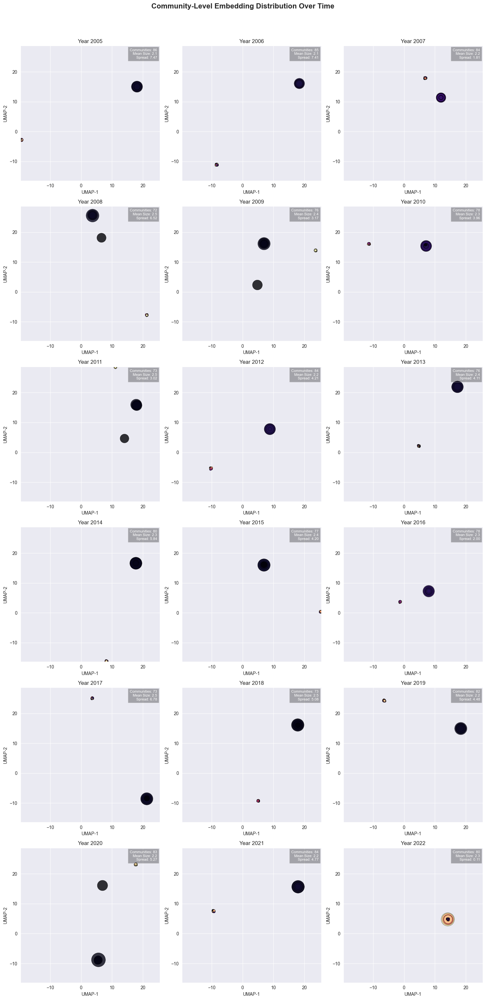

In [23]:
num_nodes = len(all_countries)
embedding_dim = list(year_embeddings.values())[0].shape[1]

###################################################
# 1. Community Aggregation by Year
###################################################
def get_communities_for_year(data_y):
    G_y = nx.Graph()
    G_y.add_nodes_from(range(num_nodes))
    for j in range(data_y.edge_index.size(1)):
        u = data_y.edge_index[0, j].item()
        v = data_y.edge_index[1, j].item()
        G_y.add_edge(u, v)
    communities = nx.algorithms.community.greedy_modularity_communities(G_y)
    return communities

year_communities = {}
for y, data_y in year_graphs:
    year_communities[y] = get_communities_for_year(data_y)

###################################################
# Community-Level Embeddings
###################################################
year_comm_embeddings = {}
year_comm_sizes = {}
for y in years_of_interest:
    emb = year_embeddings[y]
    comms = year_communities[y]

    comm_embs = []
    comm_sizes = []
    for cset in comms:
        c_indices = list(cset)
        c_emb = emb[c_indices].mean(axis=0)
        comm_embs.append(c_emb)
        comm_sizes.append(len(c_indices))
    comm_embs = np.array(comm_embs)
    year_comm_embeddings[y] = comm_embs
    year_comm_sizes[y] = np.array(comm_sizes)

all_comm_embeddings = []
comm_labels = []
for y in years_of_interest:
    cemb = year_comm_embeddings[y]
    for i in range(cemb.shape[0]):
        all_comm_embeddings.append(cemb[i])
        comm_labels.append((y, i))

all_comm_embeddings = np.vstack(all_comm_embeddings)
reducer = umap.UMAP(n_neighbors=10, min_dist=0.1, random_state=42)
all_comm_2d = reducer.fit_transform(all_comm_embeddings)

x_min, x_max = all_comm_2d[:,0].min(), all_comm_2d[:,0].max()
y_min, y_max = all_comm_2d[:,1].min(), all_comm_2d[:,1].max()

cols = 3
rows = math.ceil(len(years_of_interest)/cols)
fig, axs = plt.subplots(rows, cols, figsize=(5*cols, 5*rows))
axs = axs.flatten()

###################################################
# Plot Years Arranged in a Grid
###################################################
for idx, y in enumerate(years_of_interest):
    year_indices = [i for i, (yr, _) in enumerate(comm_labels) if yr == y]
    year_embs_2d = all_comm_2d[year_indices]
    x = year_embs_2d[:,0]
    yy = year_embs_2d[:,1]

    xy = np.vstack([x, yy])
    z = gaussian_kde(xy)(xy)

    comm_sizes = year_comm_sizes[y]
    size_scaled = 50 * (comm_sizes / comm_sizes.mean())

    ax = axs[idx]
    sc = ax.scatter(x, yy, c=z, cmap='magma', s=size_scaled, alpha=0.8, edgecolors='black', linewidths=0.5)
    ax.set_title(f"Year {y}", fontsize=12)

    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.set_xlabel("UMAP-1")
    ax.set_ylabel("UMAP-2")

    n_comms = len(comm_sizes)
    mean_size = comm_sizes.mean()
    spread = np.sqrt((x.var() + yy.var())/2.0)

    summary_text = (f"Communities: {n_comms}\n"
                    f"Mean Size: {mean_size:.1f}\n"
                    f"Spread: {spread:.2f}")
    ax.text(0.98, 0.98, summary_text, transform=ax.transAxes,
            va='top', ha='right', fontsize=8,
            bbox=dict(facecolor='black', alpha=0.3, pad=4),
            color='white')

for i in range(len(years_of_interest), len(axs)):
    fig.delaxes(axs[i])

fig.suptitle("Community-Level Embedding Distribution Over Time", fontsize=16, y=1.02, fontweight="bold")
plt.tight_layout()
plt.show()

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


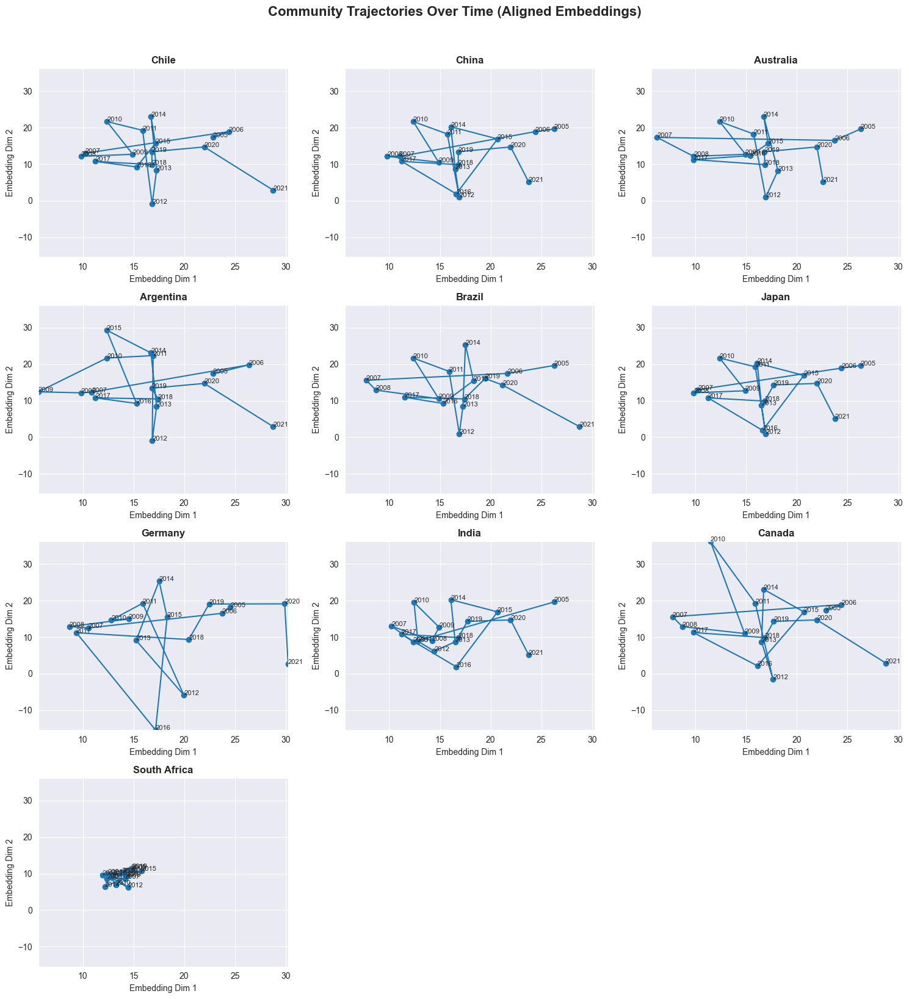

In [24]:
num_nodes = len(all_countries)
embedding_dim = 32
hidden_dim = 64
epochs = 50
lr = 0.01

def build_graph_for_year(year):
    year_df = df[df['t'] == year]
    if year_df.empty:
        data = Data(x=torch.zeros((num_nodes, 2)), edge_index=torch.empty((2,0), dtype=torch.long))
        return data

    x = build_node_features_for_year(year_df, all_countries)
    src = year_df['export_country'].map(country_to_id)
    dst = year_df['import_country'].map(country_to_id)
    edge_index = torch.tensor([src.values, dst.values], dtype=torch.long)

    attrs = year_df[edge_feature_cols].fillna(0.0).values
    attrs = scaler.transform(attrs)
    edge_attr = torch.tensor(attrs, dtype=torch.float)

    data = Data(x=x, edge_index=edge_index, edge_attr=edge_attr)
    return data

year_graphs = []
for y in years_of_interest:
    year_graphs.append((y, build_graph_for_year(y)))

##############################################
# GCN Encoder for GAE
##############################################
class GCNEncoder(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super().__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv2 = GCNConv(hidden_channels, out_channels)

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = self.conv2(x, edge_index)
        return x

##############################################
# Training
##############################################
year_embeddings = {}
device = torch.device("cuda" if torch.cuda.is_available() else "cpu") # Couldn't make mps work here for some reason

for y, data_y in year_graphs:
    data_y = data_y.to(device)

    encoder = GCNEncoder(in_channels=data_y.x.size(1), hidden_channels=hidden_dim, out_channels=embedding_dim)
    model = GAE(encoder=encoder).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    rev_edge_index = torch.stack([data_y.edge_index[1], data_y.edge_index[0]], dim=0)
    full_edge_index = torch.cat([data_y.edge_index, rev_edge_index], dim=1)
    data_y.edge_index = full_edge_index

    model.train()
    for epoch in range(epochs):
        optimizer.zero_grad()
        z = model.encode(data_y.x, data_y.edge_index)
        loss = model.recon_loss(z, data_y.edge_index)
        loss.backward()
        optimizer.step()

    model.eval()
    with torch.no_grad():
        z = model.encode(data_y.x, data_y.edge_index)
    year_embeddings[y] = z.cpu().numpy()

##############################################
# Alignment of Embeddings over Time
##############################################
def align_embeddings(ref_emb, target_emb):
    ref_mean = ref_emb.mean(axis=0, keepdims=True)
    tgt_mean = target_emb.mean(axis=0, keepdims=True)
    ref_centered = ref_emb - ref_mean
    tgt_centered = target_emb - tgt_mean
    U, S, Vt = np.linalg.svd(ref_centered.T @ tgt_centered)
    R = U @ Vt
    aligned = (tgt_centered @ R)
    aligned *= (np.linalg.norm(ref_centered) / np.linalg.norm(aligned))
    aligned += ref_mean
    return aligned

ref_year = years_of_interest[0]
ref_emb = year_embeddings[ref_year]
for y in years_of_interest[1:]:
    year_embeddings[y] = align_embeddings(ref_emb, year_embeddings[y])

##############################################
# Community Detection and Tracking
##############################################
year_communities = {}
for y, data_y in year_graphs:
    ei = data_y.edge_index.cpu().numpy() if data_y.edge_index.numel() > 0 else np.empty((2,0),dtype=int)
    G = nx.Graph()
    G.add_nodes_from(range(num_nodes))
    for j in range(ei.shape[1]):
        G.add_edge(ei[0,j], ei[1,j])
    comms = nx.algorithms.community.greedy_modularity_communities(G, weight="inverse_weight")
    year_communities[y] = comms

def find_community_for_country(comms, cid):
    for i, cset in enumerate(comms):
        if cid in cset:
            return i
    return None

##############################################
# Visualization of Country Trajectory
##############################################
key_countries = [
    "Chile", "China", "USA", "Australia", "Argentina",
    "Brazil", "Japan", "Germany", "India", "Rep. of Korea",
    "Canada", "South Africa"
]

country_ids = {c: country_to_id[c] for c in key_countries if c in country_to_id}

country_trajectories = {}
all_coords = []

for ctry, cid in country_ids.items():
    community_positions_over_time = []
    for y in years_of_interest:
        comms = year_communities[y]
        c_idx = find_community_for_country(comms, cid)
        if c_idx is not None:
            emb = year_embeddings[y]
            c_indices = list(comms[c_idx])
            c_position = emb[c_indices].mean(axis=0)
            community_positions_over_time.append((y, c_position))
    country_trajectories[ctry] = community_positions_over_time

    if len(community_positions_over_time) > 0:
        _, coords = zip(*community_positions_over_time)
        coords = np.array(coords)
        all_coords.append(coords)

if len(all_coords) > 0:
    all_coords_stacked = np.vstack(all_coords)
    x_min = np.nanmin(all_coords_stacked[:,0])
    x_max = np.nanmax(all_coords_stacked[:,0])
    y_min = np.nanmin(all_coords_stacked[:,1])
    y_max = np.nanmax(all_coords_stacked[:,1])

else:
    x_min, x_max, y_min, y_max = -1, 1, -1, 1

num_countries = len(country_trajectories)
cols = 3
rows = (num_countries + cols - 1) // cols

fig, axs = plt.subplots(rows, cols, figsize=(5*cols, 4*rows))
axs = axs.flatten()

for i, (ctry, traj) in enumerate(country_trajectories.items()):
    ax = axs[i]
    if len(traj) > 0:
        ys, coords = zip(*traj)
        coords = np.array(coords)
        ax.plot(coords[:,0], coords[:,1], marker='o')
        for j, yy in enumerate(ys):
            ax.text(coords[j,0], coords[j,1], str(yy), fontsize=8)

        ax.set_title(f"{ctry}", fontweight="bold")
        ax.set_xlabel("Embedding Dim 1")
        ax.set_ylabel("Embedding Dim 2")
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
    else:
        ax.text(0.5,0.5,"No Data",ha='center',va='center',fontsize=10)
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
        ax.set_xlabel("Embedding Dim 1")
        ax.set_ylabel("Embedding Dim 2")

for k in range(num_countries, rows*cols):
    fig.delaxes(axs[k])

fig.suptitle("Community Trajectories Over Time (Aligned Embeddings)", fontsize=16, y=1.02, fontweight="bold")
plt.tight_layout()
plt.show()

### Greedy Modularity Communities

Community Stability Over Time (NMI):
 [(np.int64(2002), np.int64(2003), np.float64(0.35550210991787967)), (np.int64(2003), np.int64(2004), np.float64(0.40298109725281905)), (np.int64(2004), np.int64(2005), np.float64(0.31920602589334846)), (np.int64(2005), np.int64(2006), np.float64(0.2742103888008772)), (np.int64(2006), np.int64(2007), np.float64(0.2648087116211018)), (np.int64(2007), np.int64(2008), np.float64(0.29305708671335867)), (np.int64(2008), np.int64(2009), np.float64(0.32800395738337873)), (np.int64(2009), np.int64(2010), np.float64(0.3890116176531653)), (np.int64(2010), np.int64(2011), np.float64(0.3192769764249884)), (np.int64(2011), np.int64(2012), np.float64(0.2782061231754126)), (np.int64(2012), np.int64(2013), np.float64(0.4073910584571774)), (np.int64(2013), np.int64(2014), np.float64(0.3053798664400247)), (np.int64(2014), np.int64(2015), np.float64(0.10244676815622017)), (np.int64(2015), np.int64(2016), np.float64(0.12385756604159853)), (np.int64(2016), np.int64(2017

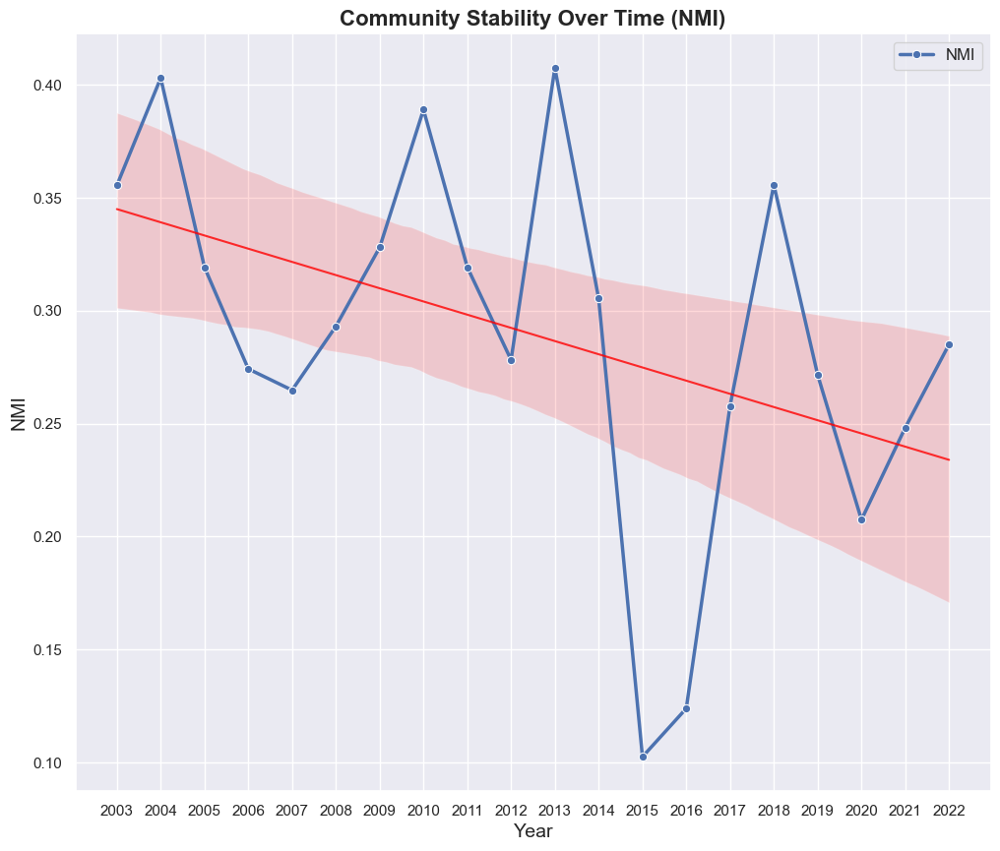

In [25]:
##############################################
# Data Loading
##############################################
cc_df = loader.country_codes.to_pandas()
country_code_to_name = dict(zip(cc_df["country_code"], cc_df["country_name"]))
country_code_to_iso3 = dict(zip(cc_df["country_code"], cc_df["country_iso3"]))

##############################################
# Communities Per Year
##############################################
year_communities = {}
for y, G in yearly_graphs.items():
    comms = greedy_modularity_communities(G, weight='inverse_weight')
    node2comm = {}
    for i, cset in enumerate(comms):
        for node in cset:
            node2comm[node] = i
    year_communities[y] = node2comm

##############################################
# Year-to-Year Community Stability (NMI)
##############################################
years_sorted = sorted(yearly_graphs.keys())
stability_results = []
for i in range(len(years_sorted)-1):
    y1, y2 = years_sorted[i], years_sorted[i+1]
    common_nodes = set(year_communities[y1].keys()).intersection(year_communities[y2].keys())
    c1 = [year_communities[y1][n] for n in common_nodes]
    c2 = [year_communities[y2][n] for n in common_nodes]
    nmi = normalized_mutual_info_score(c1, c2)
    stability_results.append((y1, y2, nmi))

print("Community Stability Over Time (NMI):\n", stability_results)

##############################################
# Visualization
##############################################
nmi_df = pd.DataFrame(stability_results, columns=['year_start', 'year_end', 'NMI'])
nmi_df['year'] = nmi_df['year_end']

plt.figure(figsize=(12, 10))
sns.set_theme(style="darkgrid")

sns.lineplot(x='year', y='NMI', data=nmi_df, marker='o', linewidth=2.5, label='NMI')
sns.regplot(x='year', y='NMI', data=nmi_df, scatter=False,
            line_kws={'color': 'red', 'lw': 1.5, 'alpha':0.8})

plt.title("Community Stability Over Time (NMI)", fontsize=16, fontweight='bold')
plt.xlabel("Year", fontsize=14)
plt.xticks(nmi_df["year"].unique().astype(int))
plt.ylabel("NMI", fontsize=14)
plt.legend(fontsize=12)

Intra-Community Trade Ratio Over Time:
 [(np.int64(2002), 0.08008022797713633), (np.int64(2003), 0.1434548274762472), (np.int64(2004), 0.09912915768955886), (np.int64(2005), 0.1479715586657297), (np.int64(2006), 0.08284786385041754), (np.int64(2007), 0.10073106006984632), (np.int64(2008), 0.0359634037398425), (np.int64(2009), 0.06252292053273607), (np.int64(2010), 0.22996589512641835), (np.int64(2011), 0.11139475646606209), (np.int64(2012), 0.03516408966018513), (np.int64(2013), 0.08863696983691662), (np.int64(2014), 0.08345818920540464), (np.int64(2015), 0.29972368054406395), (np.int64(2016), 0.07362770589791558), (np.int64(2017), 0.1874401056452383), (np.int64(2018), 0.07681366256785517), (np.int64(2019), 0.03836183744948044), (np.int64(2020), 0.045675627411395), (np.int64(2021), 0.21736235324036665), (np.int64(2022), 0.14087586671577176)]


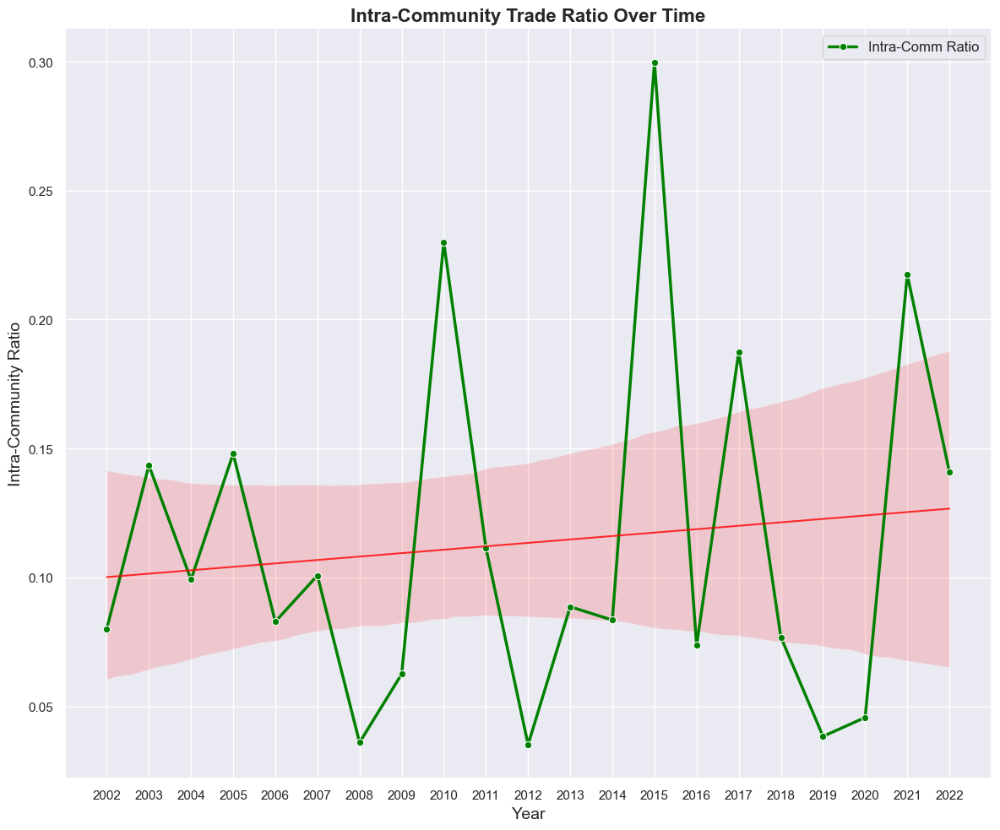

In [26]:
##############################################
# Compute Intra-Community Trade Ratio per Year
##############################################
intra_ratios = []
for y, G in yearly_graphs.items():
    comm_map = year_communities[y]
    intra_weight = 0.0
    inter_weight = 0.0

    for u, v, d in G.edges(data=True):
        if comm_map.get(u) == comm_map.get(v):
            intra_weight += d.get('weight', 0)
        else:
            inter_weight += d.get('weight', 0)

    total_weight = intra_weight + inter_weight
    if total_weight > 0:
        ratio = intra_weight / total_weight
        intra_ratios.append((y, ratio))

print("Intra-Community Trade Ratio Over Time:\n", intra_ratios)

intra_df = pd.DataFrame(intra_ratios, columns=['year', 'intra_ratio'])

##############################################
# Visualization
##############################################
plt.figure(figsize=(12, 10))
sns.set_theme(style="darkgrid")
sns.lineplot(x='year', y='intra_ratio', data=intra_df, marker='o', linewidth=2.5, color='green', label='Intra-Comm Ratio')
sns.regplot(x='year', y='intra_ratio', data=intra_df, scatter=False,
            line_kws={'color': 'red', 'lw': 1.5, 'alpha':0.8})

plt.title("Intra-Community Trade Ratio Over Time", fontsize=16, fontweight='bold')
plt.xlabel("Year", fontsize=14)
plt.xticks(intra_df["year"].unique().astype(int))
plt.ylabel("Intra-Community Ratio", fontsize=14)
plt.legend(fontsize=12)

plt.tight_layout()
plt.show()

### Louvain Communities

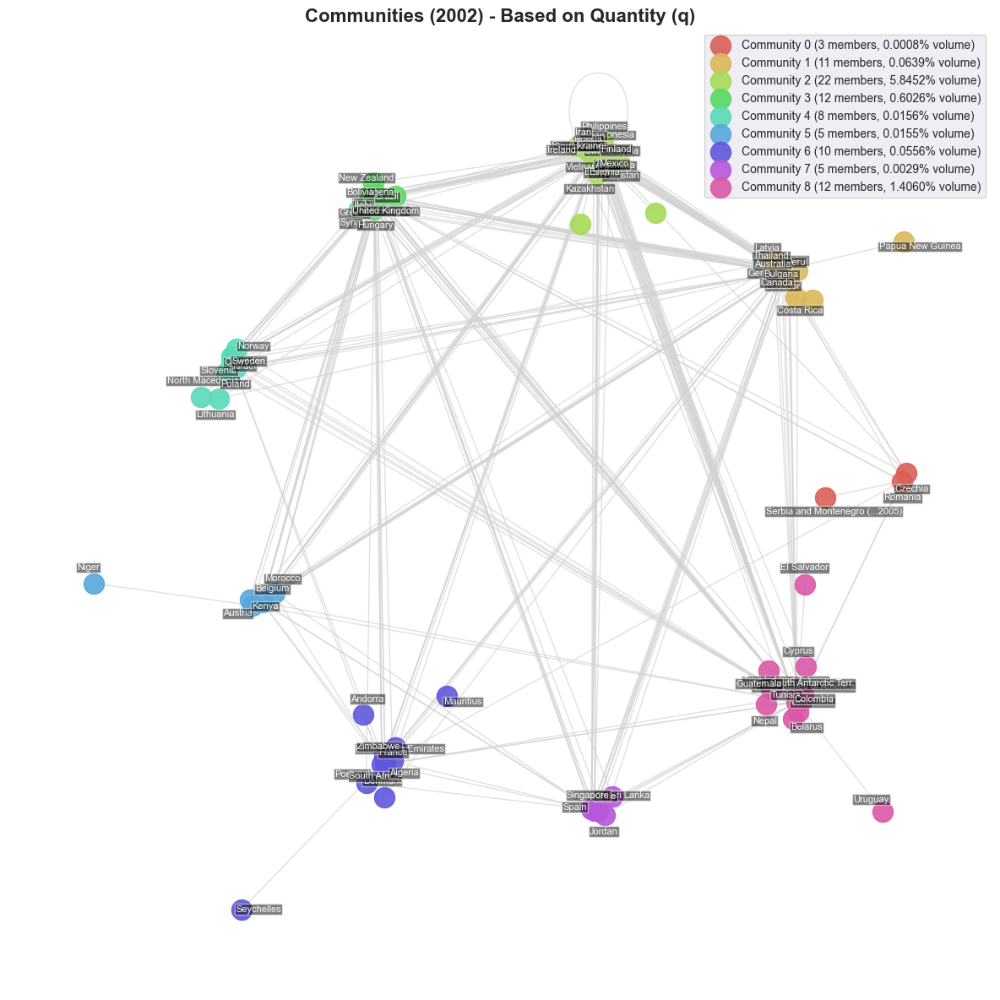

Top Countries by Community based on q for year 0.7522046041654362:
Community 0:
  Czechia | Romania | Serbia and Montenegro (...2005)
Community 1:
  Germany | Australia | Canada | Thailand | Peru | Bulgaria | Latvia | Slovakia | Ecuador | Costa Rica | Papua New Guinea
Community 2:
  Russia | Japan | China | South Korea | Switzerland | Mexico | Saudi Arabia | Ukraine | Estonia | Argentina | Egypt | Indonesia | Iran | Vietnam | Finland | Philippines | Malaysia | Ireland | Kazakhstan | Pakistan
Community 3:
  United Kingdom | India | Netherlands | Italy | Turkey | Brazil | New Zealand | Greece | Hungary | Bolivia | Syria | Nigeria
Community 4:
  Sweden | Poland | Slovenia | Israel | Croatia | Norway | Lithuania | North Macedonia
Community 5:
  Belgium | Austria | Morocco | Kenya | Niger
Community 6:
  France | South Africa | United Arab Emirates | Algeria | Zimbabwe | Portugal | Denmark | Andorra | Mauritius | Seychelles
Community 7:
  Spain | Singapore | Chile | Jordan | Sri Lanka
Commun

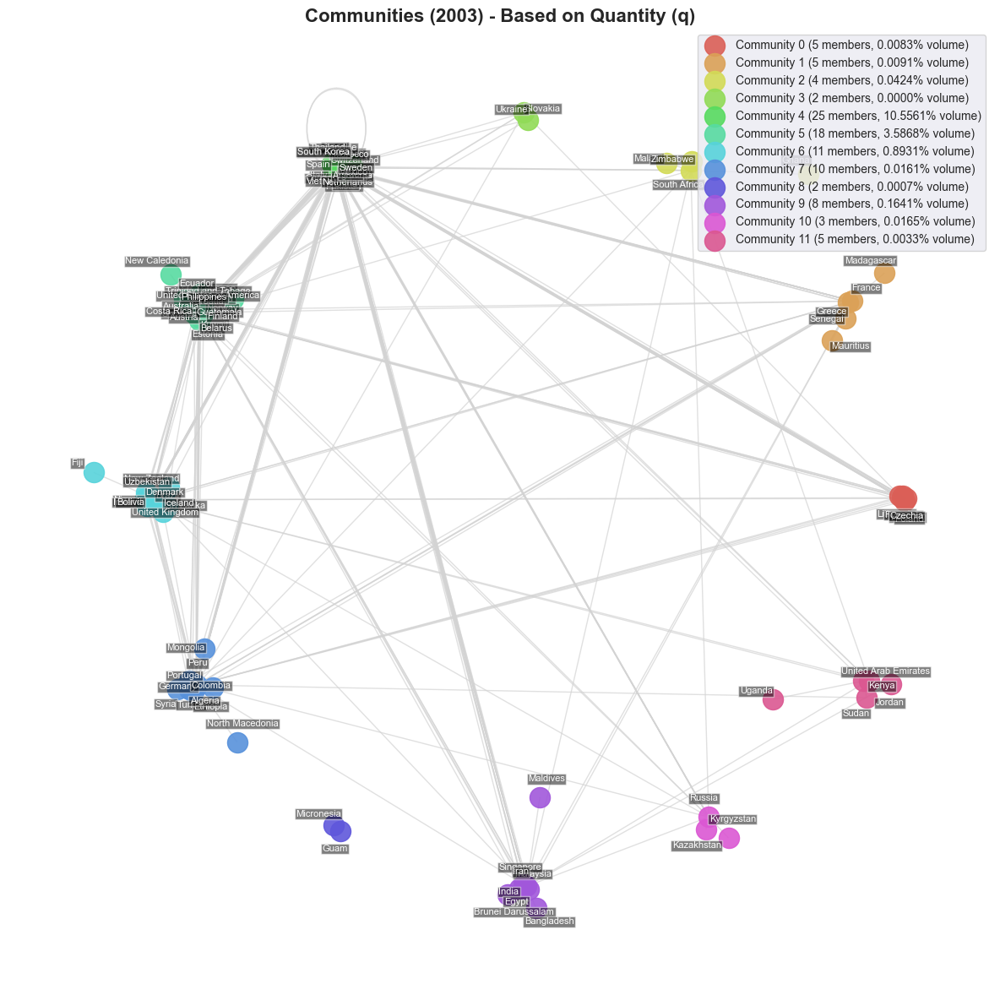

Top Countries by Community based on q for year 1.736455533525103:
Community 0:
  Poland | Czechia | Romania | Hungary | Lithuania
Community 1:
  France | Greece | Senegal | Madagascar | Mauritius
Community 2:
  South Africa | Zimbabwe | Malawi | Ghana
Community 3:
  Ukraine | Slovakia
Community 4:
  Belgium | Japan | China | Netherlands | South Korea | Spain | Italy | Sweden | Canada | Saudi Arabia | Thailand | Argentina | Switzerland | Mexico | Chile | Israel | Pakistan | Vietnam | Cuba | Morocco
Community 5:
  United States of America | Australia | Slovenia | Austria | Venezuela | Finland | Philippines | Estonia | Norway | Croatia | Kuwait | Belarus | Ecuador | Trinidad and Tobago | Lebanon | Costa Rica | Guatemala | New Caledonia
Community 6:
  United Kingdom | New Zealand | Uzbekistan | Brazil | Ireland | Bolivia | Nigeria | Sri Lanka | Denmark | Iceland | Fiji
Community 7:
  Germany | Turkey | Colombia | Portugal | Peru | Algeria | Ethiopia | Syria | Mongolia | North Macedonia
Com

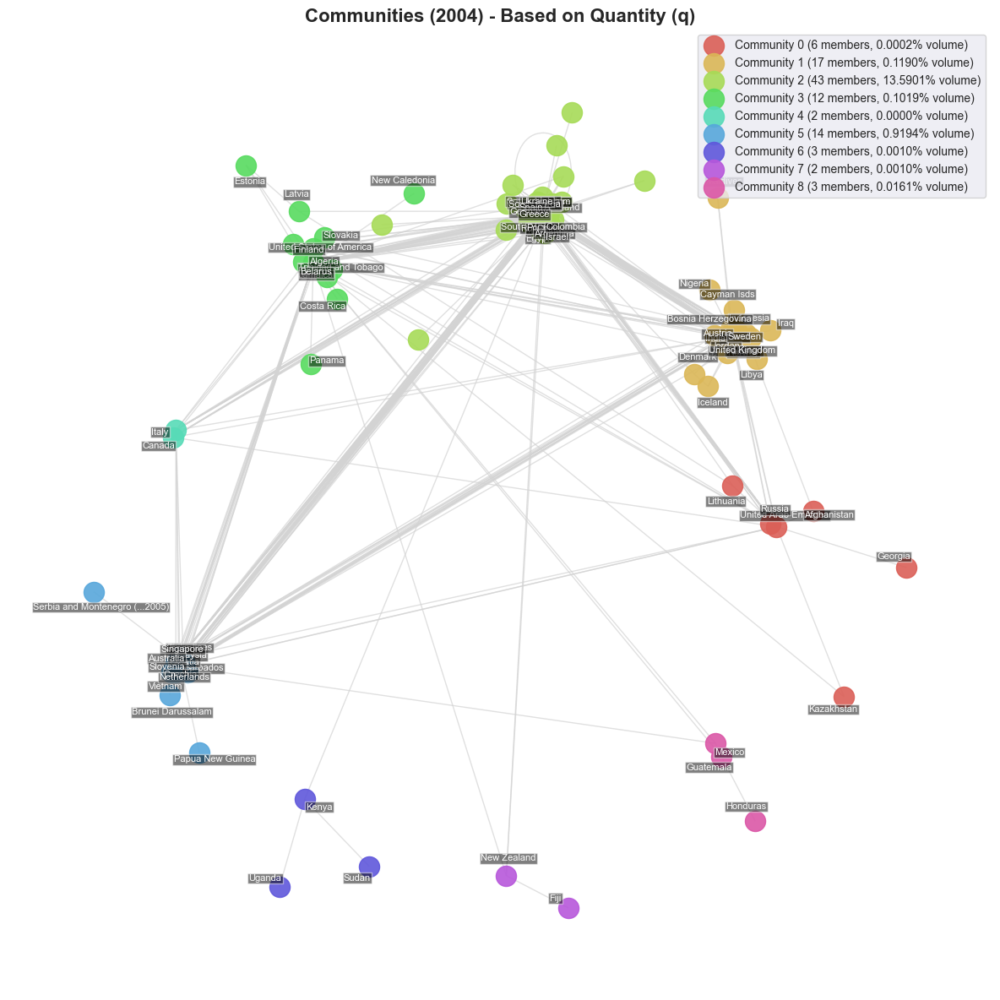

Top Countries by Community based on q for year 1.2521495376968745:
Community 0:
  Russia | United Arab Emirates | Afghanistan | Lithuania | Georgia | Kazakhstan
Community 1:
  India | United Kingdom | Sweden | Jordan | Austria | Indonesia | Pakistan | Norway | Ireland | Bosnia Herzegovina | Cayman Isds | Iraq | Libya | Iceland | Denmark | Nigeria | Maldives
Community 2:
  Belgium | Germany | China | France | South Korea | Spain | South Africa | Argentina | Poland | Saudi Arabia | Turkey | Thailand | Romania | Switzerland | Chile | Ukraine | Egypt | Colombia | Israel | Greece
Community 3:
  United States of America | Belarus | Algeria | Slovakia | Trinidad and Tobago | Jamaica | Finland | Costa Rica | Latvia | Panama | Estonia | New Caledonia
Community 4:
  Canada | Italy
Community 5:
  Japan | Malaysia | Netherlands | Australia | Slovenia | Singapore | Barbados | Czechia | Vietnam | Philippines | Croatia | Brunei Darussalam | Papua New Guinea | Serbia and Montenegro (...2005)
Community

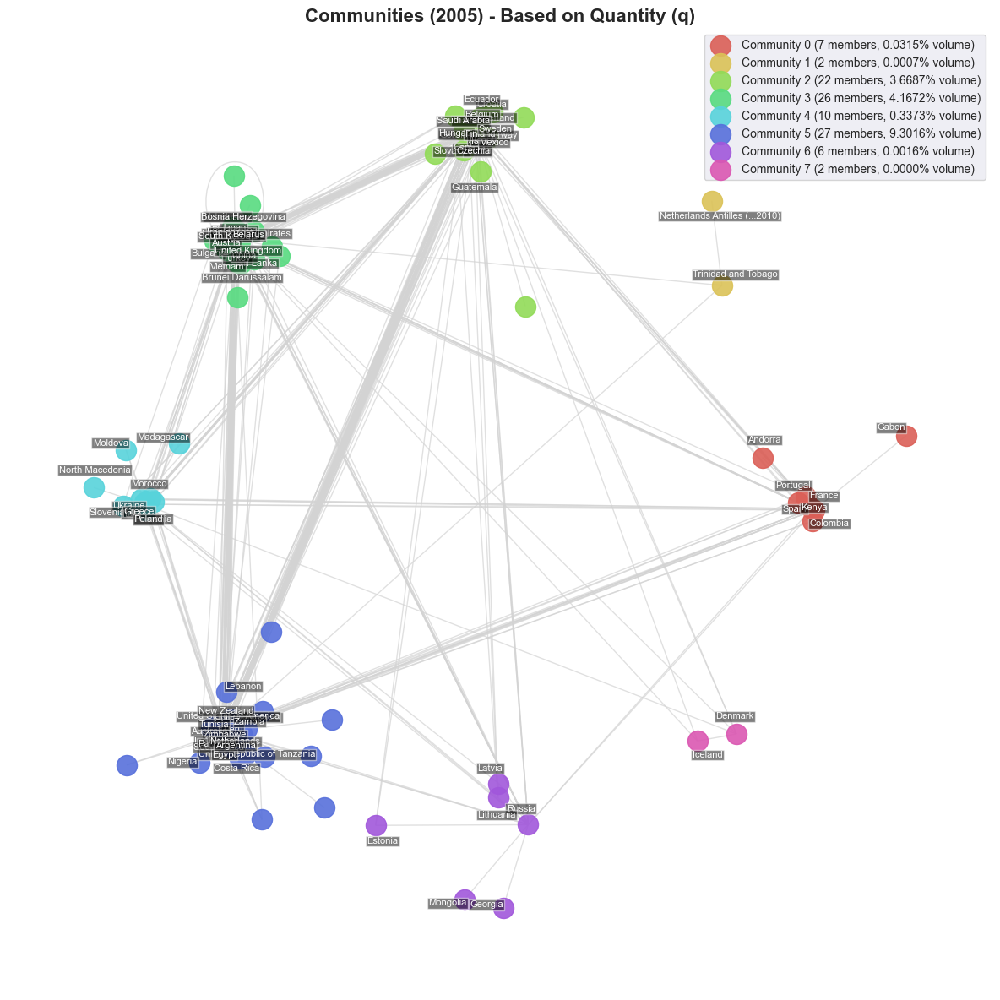

Top Countries by Community based on q for year 2.0737565024009554:
Community 0:
  France | Spain | Colombia | Portugal | Kenya | Andorra | Gabon
Community 1:
  Trinidad and Tobago | Netherlands Antilles (...2010)
Community 2:
  Belgium | Germany | Canada | Mexico | Saudi Arabia | Thailand | Czechia | Sweden | Switzerland | Algeria | Israel | Norway | Finland | Bolivia | Croatia | Brazil | Hungary | Ecuador | Guatemala | Slovakia
Community 3:
  Japan | China | United Kingdom | South Korea | United Arab Emirates | Turkey | Singapore | Barbados | Malaysia | Philippines | Uzbekistan | Vietnam | Iran | Austria | Indonesia | Brunei Darussalam | Bulgaria | Belarus | Bosnia Herzegovina | Sri Lanka
Community 4:
  Italy | Poland | Ukraine | Slovenia | Greece | Romania | Morocco | North Macedonia | Moldova | Madagascar
Community 5:
  United States of America | India | Netherlands | South Africa | Chile | Argentina | Australia | Egypt | Pakistan | New Zealand | Kuwait | Tunisia | Peru | Zimbabwe |

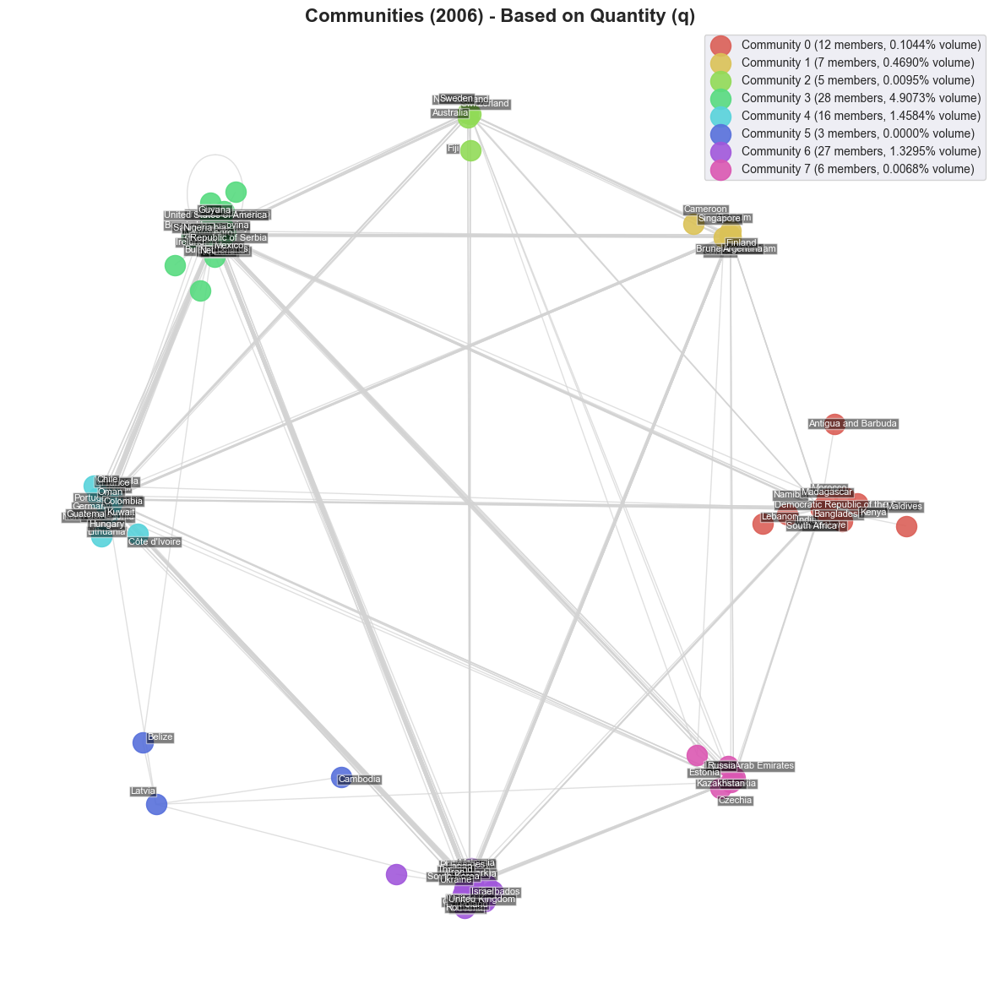

Top Countries by Community based on q for year 1.399395247927602:
Community 0:
  India | South Africa | Morocco | Bangladesh | Democratic Republic of the Congo | Zimbabwe | Madagascar | Namibia | Kenya | Lebanon | Antigua and Barbuda | Maldives
Community 1:
  Belgium | Canada | Argentina | Singapore | Brunei Darussalam | Finland | Cameroon
Community 2:
  Sweden | Switzerland | Australia | New Zealand | Fiji
Community 3:
  United States of America | China | Netherlands | Spain | Mexico | Egypt | Saudi Arabia | Pakistan | Norway | Tunisia | Belarus | Republic of Serbia | Bulgaria | Peru | Trinidad and Tobago | Bosnia Herzegovina | Nigeria | Ireland | Montenegro | Guyana
Community 4:
  Chile | Germany | France | Colombia | Venezuela | Austria | Kuwait | Cuba | Hungary | Brazil | Portugal | Guatemala | Lithuania | Oman | North Macedonia | Côte d'Ivoire
Community 5:
  Latvia | Belize | Cambodia
Community 6:
  Japan | United Kingdom | South Korea | Turkey | Italy | Thailand | Poland | Malays

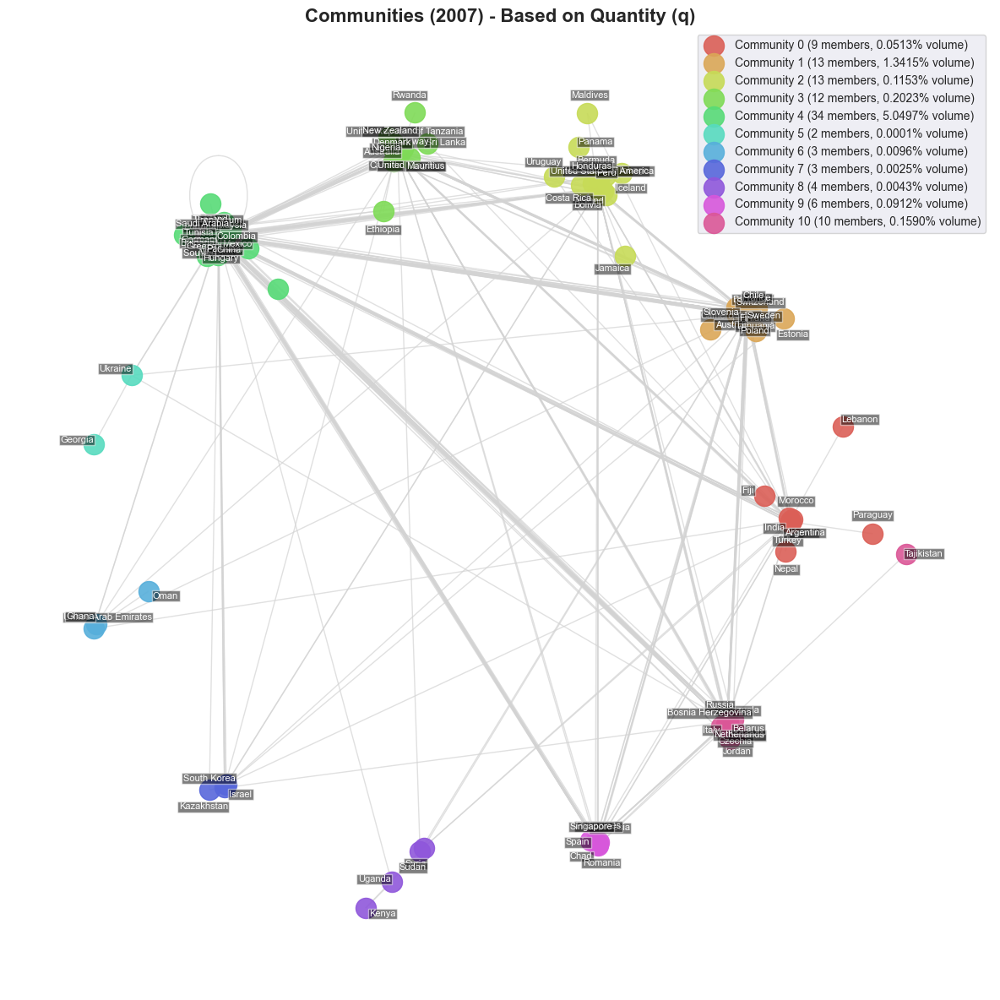

Top Countries by Community based on q for year 1.0850824374479102:
Community 0:
  India | Turkey | Argentina | Kuwait | Morocco | Nepal | Fiji | Paraguay | Lebanon
Community 1:
  Chile | France | Switzerland | Poland | Slovenia | Barbados | Sweden | Austria | Finland | Lithuania | Latvia | Estonia | Cameroon
Community 2:
  United States of America | Bolivia | Peru | Trinidad and Tobago | Ireland | Bermuda | Honduras | Costa Rica | Iceland | Panama | Uruguay | Jamaica | Maldives
Community 3:
  United Kingdom | Canada | Australia | New Zealand | Nigeria | Denmark | Norway | Mauritius | United Republic of Tanzania | Sri Lanka | Rwanda | Ethiopia
Community 4:
  Belgium | China | Japan | Germany | South Africa | Thailand | Mexico | Malaysia | Colombia | Egypt | Iran | Saudi Arabia | Greece | Brazil | Pakistan | Vietnam | Portugal | Hungary | Tunisia | Bulgaria
Community 5:
  Ukraine | Georgia
Community 6:
  United Arab Emirates | Ghana | Oman
Community 7:
  South Korea | Israel | Kazakhstan

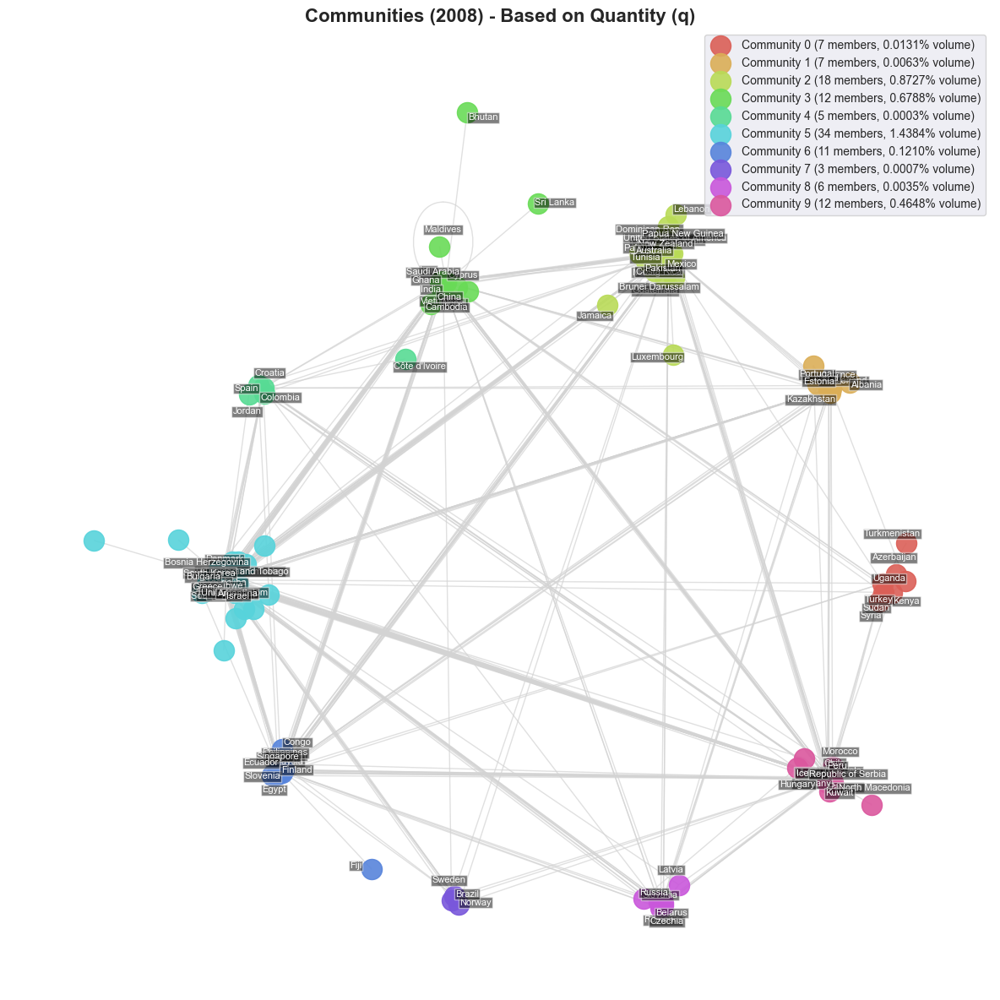

Top Countries by Community based on q for year -1.1435339080205793:
Community 0:
  Turkey | Sudan | Kenya | Syria | Azerbaijan | Uganda | Turkmenistan
Community 1:
  France | Thailand | Switzerland | Portugal | Kazakhstan | Albania | Estonia
Community 2:
  United States of America | Mexico | Australia | Indonesia | Tunisia | Pakistan | Costa Rica | New Zealand | Dominican Rep. | Brunei Darussalam | Guatemala | Palau | Madagascar | Papua New Guinea | Cameroon | Lebanon | Jamaica | Luxembourg
Community 3:
  China | India | Saudi Arabia | Vietnam | Iran | Ghana | Nepal | Cambodia | Cyprus | Maldives | Sri Lanka | Bhutan
Community 4:
  Spain | Colombia | Croatia | Jordan | Côte d'Ivoire
Community 5:
  Netherlands | South Korea | United Kingdom | Argentina | South Africa | United Arab Emirates | Italy | Canada | Algeria | Poland | Greece | Austria | Israel | Denmark | Cuba | Bosnia Herzegovina | Nigeria | Trinidad and Tobago | Bulgaria | Zimbabwe
Community 6:
  Belgium | Japan | Slovenia | 

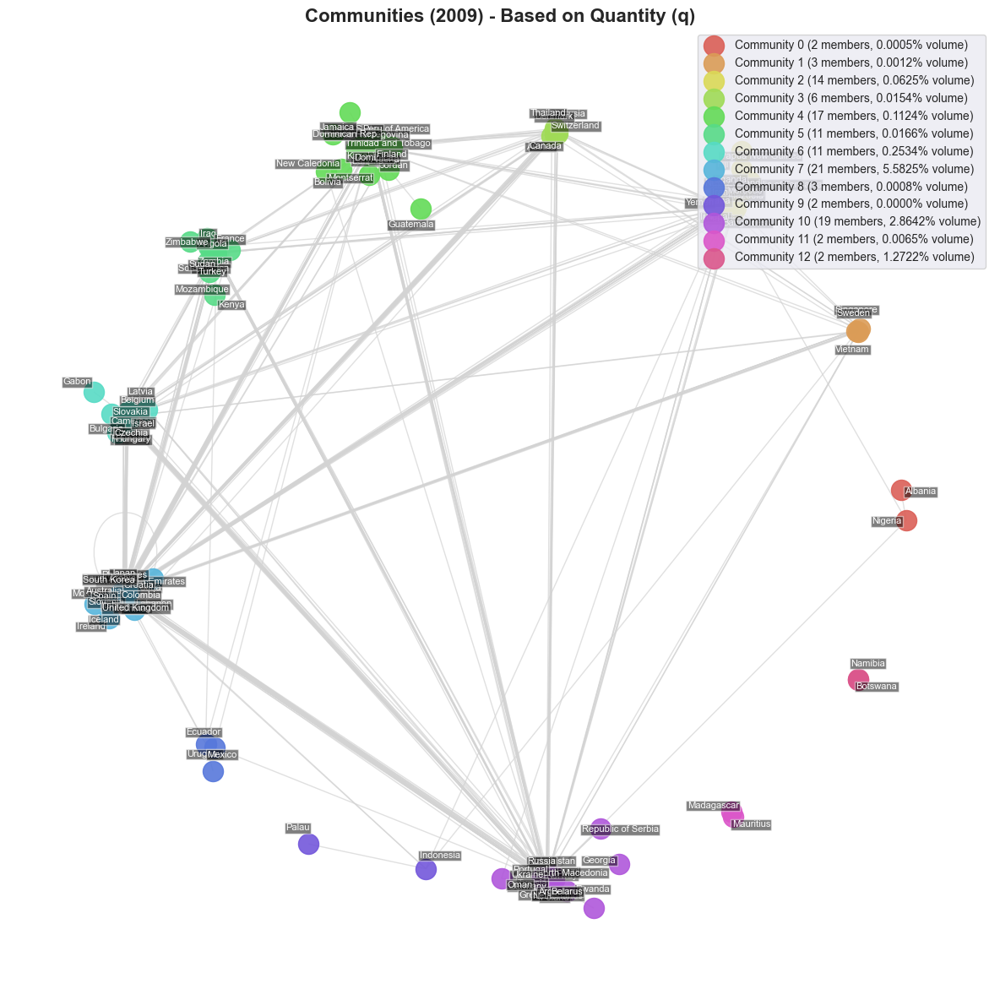

Top Countries by Community based on q for year -1.7218924712013528:
Community 0:
  Nigeria | Albania
Community 1:
  Singapore | Sweden | Vietnam
Community 2:
  India | Venezuela | Iran | Morocco | New Zealand | Ghana | Bangladesh | Ethiopia | Yemen | United Republic of Tanzania | Uganda | Nepal | Fiji | Papua New Guinea
Community 3:
  Thailand | Switzerland | Canada | Austria | Malaysia | Denmark
Community 4:
  United States of America | Algeria | Finland | Peru | Bosnia Herzegovina | Trinidad and Tobago | Dominican Rep. | Kazakhstan | Dominica | Jordan | Montserrat | Bahamas | Bolivia | Belize | Jamaica | New Caledonia | Guatemala
Community 5:
  France | Turkey | South Africa | Syria | Sudan | Angola | Zambia | Zimbabwe | Mozambique | Iraq | Kenya
Community 6:
  Belgium | Egypt | Czechia | Romania | Bulgaria | Israel | Hungary | Slovakia | Latvia | Cameroon | Gabon
Community 7:
  Chile | Japan | United Kingdom | China | South Korea | Spain | Saudi Arabia | Australia | Slovenia | Unite

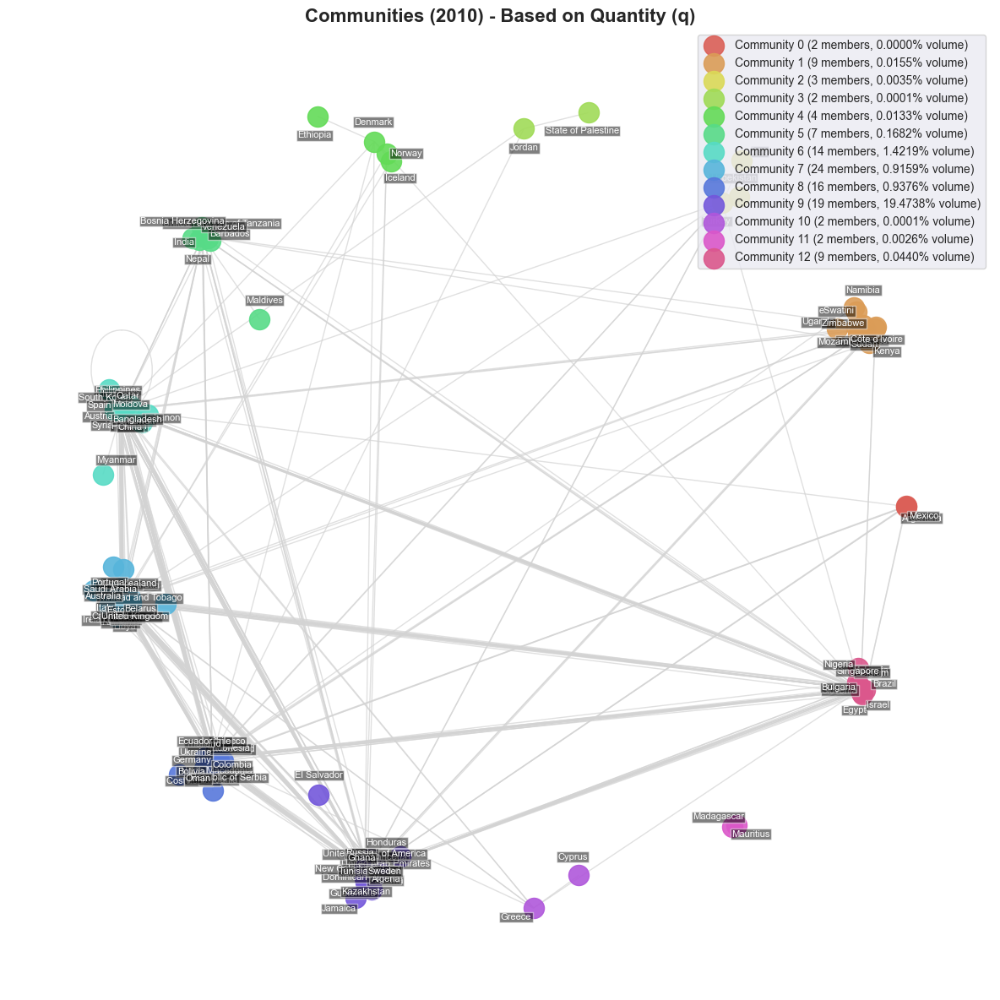

Top Countries by Community based on q for year -1.8740959013791383:
Community 0:
  Argentina | Mexico
Community 1:
  South Africa | Sudan | Zimbabwe | Kenya | Mozambique | Côte d'Ivoire | eSwatini | Namibia | Uganda
Community 2:
  Turkey | Uzbekistan | Iraq
Community 3:
  Jordan | State of Palestine
Community 4:
  Norway | Denmark | Iceland | Ethiopia
Community 5:
  India | Venezuela | Barbados | Nepal | United Republic of Tanzania | Bosnia Herzegovina | Maldives
Community 6:
  South Korea | China | Spain | Iran | Philippines | Austria | Syria | Pakistan | Bangladesh | Kuwait | Qatar | Lebanon | Moldova | Myanmar
Community 7:
  United Kingdom | Netherlands | Canada | Saudi Arabia | Italy | Australia | Poland | Romania | Czechia | Peru | Portugal | Libya | Belarus | Hungary | Trinidad and Tobago | New Zealand | Croatia | Estonia | Angola | Ireland
Community 8:
  Chile | Germany | Thailand | Ukraine | Switzerland | Indonesia | Colombia | Morocco | Vietnam | Bolivia | Republic of Serbia |

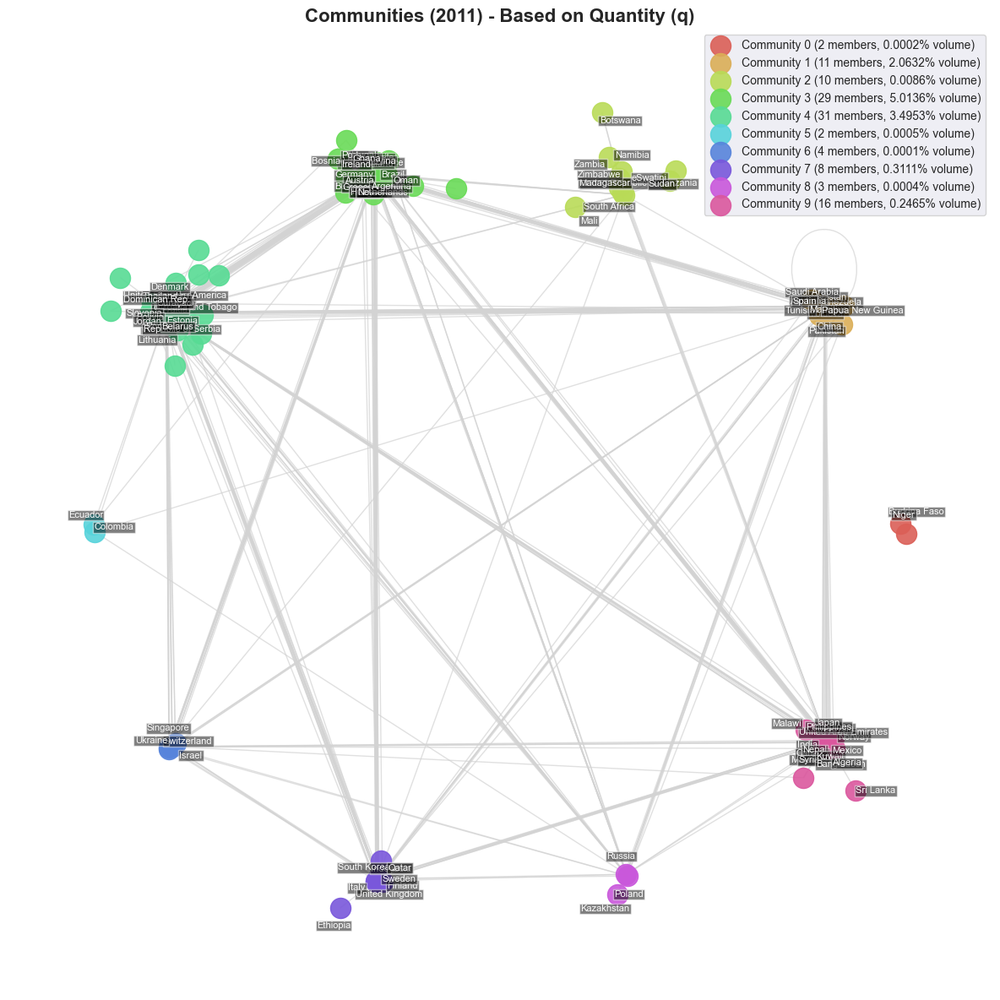

Top Countries by Community based on q for year -1.8830051522251787:
Community 0:
  Niger | Burkina Faso
Community 1:
  China | Spain | Saudi Arabia | Australia | Venezuela | Tunisia | Pakistan | Kyrgyzstan | Mauritius | Papua New Guinea | Moldova
Community 2:
  South Africa | Madagascar | United Republic of Tanzania | Zimbabwe | Namibia | Zambia | eSwatini | Mali | Sudan | Botswana
Community 3:
  Chile | Germany | Netherlands | France | Turkey | Argentina | Egypt | Czechia | Brazil | Iran | Austria | Greece | Portugal | Hungary | Ghana | Bulgaria | New Zealand | Oman | Bosnia Herzegovina | Ireland
Community 4:
  United States of America | Belgium | Thailand | Slovenia | Vietnam | Romania | Belarus | Bolivia | Morocco | Dominican Rep. | Peru | Denmark | Trinidad and Tobago | Republic of Serbia | Lithuania | Croatia | Curaçao | Slovakia | Estonia | Jordan
Community 5:
  Colombia | Ecuador
Community 6:
  Singapore | Switzerland | Ukraine | Israel
Community 7:
  South Korea | United Kingdo

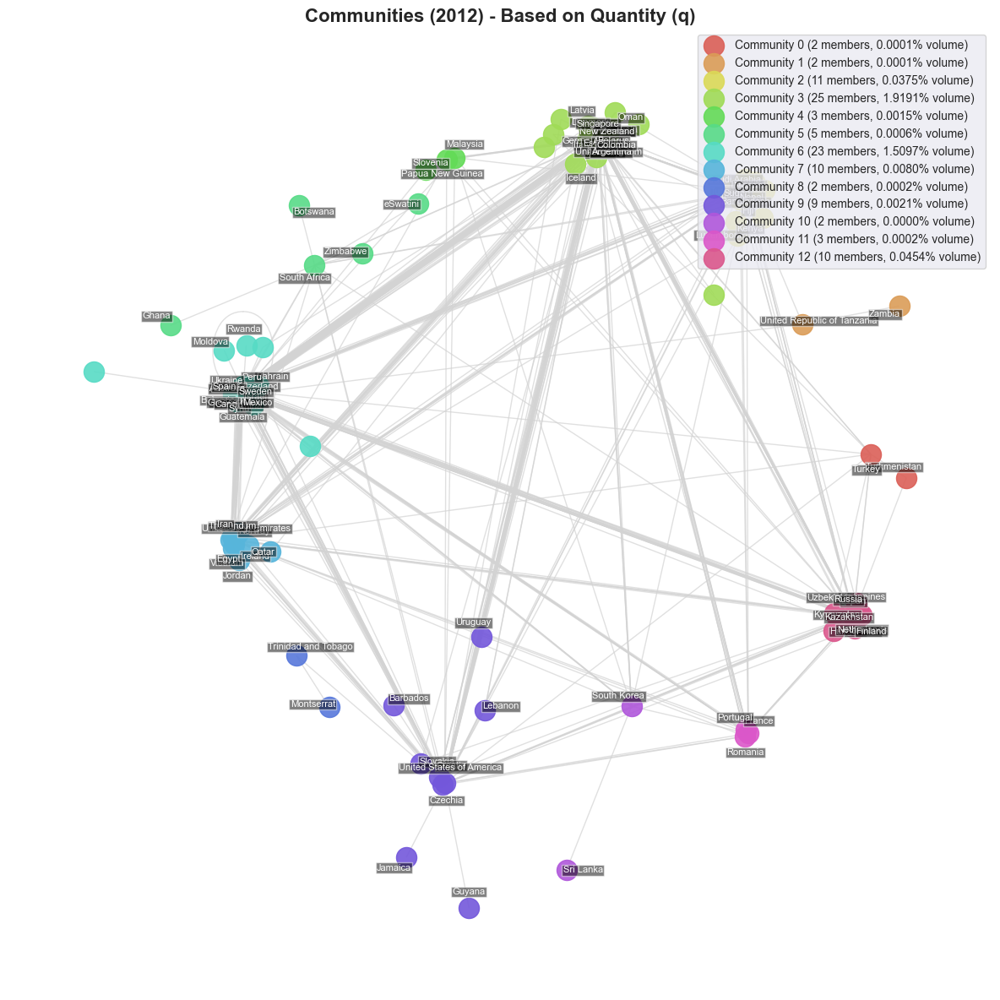

Top Countries by Community based on q for year 0.46239032702442817:
Community 0:
  Turkey | Turkmenistan
Community 1:
  United Republic of Tanzania | Zambia
Community 2:
  India | Saudi Arabia | Tunisia | Morocco | Bangladesh | Sudan | Nepal | Nigeria | Fiji | Kenya | Luxembourg
Community 3:
  Chile | Germany | United Kingdom | Singapore | Poland | Argentina | Italy | Colombia | Indonesia | Venezuela | Belarus | Lithuania | Algeria | New Zealand | Denmark | Estonia | Latvia | Brazil | Oman | Iceland
Community 4:
  Slovenia | Malaysia | Papua New Guinea
Community 5:
  South Africa | Zimbabwe | Botswana | eSwatini | Ghana
Community 6:
  China | Canada | Spain | Sweden | Mexico | Australia | Switzerland | Ukraine | Austria | Kuwait | Peru | Greece | Israel | Syria | Bulgaria | Ecuador | Guatemala | Bahrain | Moldova | Rwanda
Community 7:
  Belgium | United Arab Emirates | Thailand | Iran | Egypt | Vietnam | Norway | Qatar | Jordan | Ireland
Community 8:
  Trinidad and Tobago | Montserrat


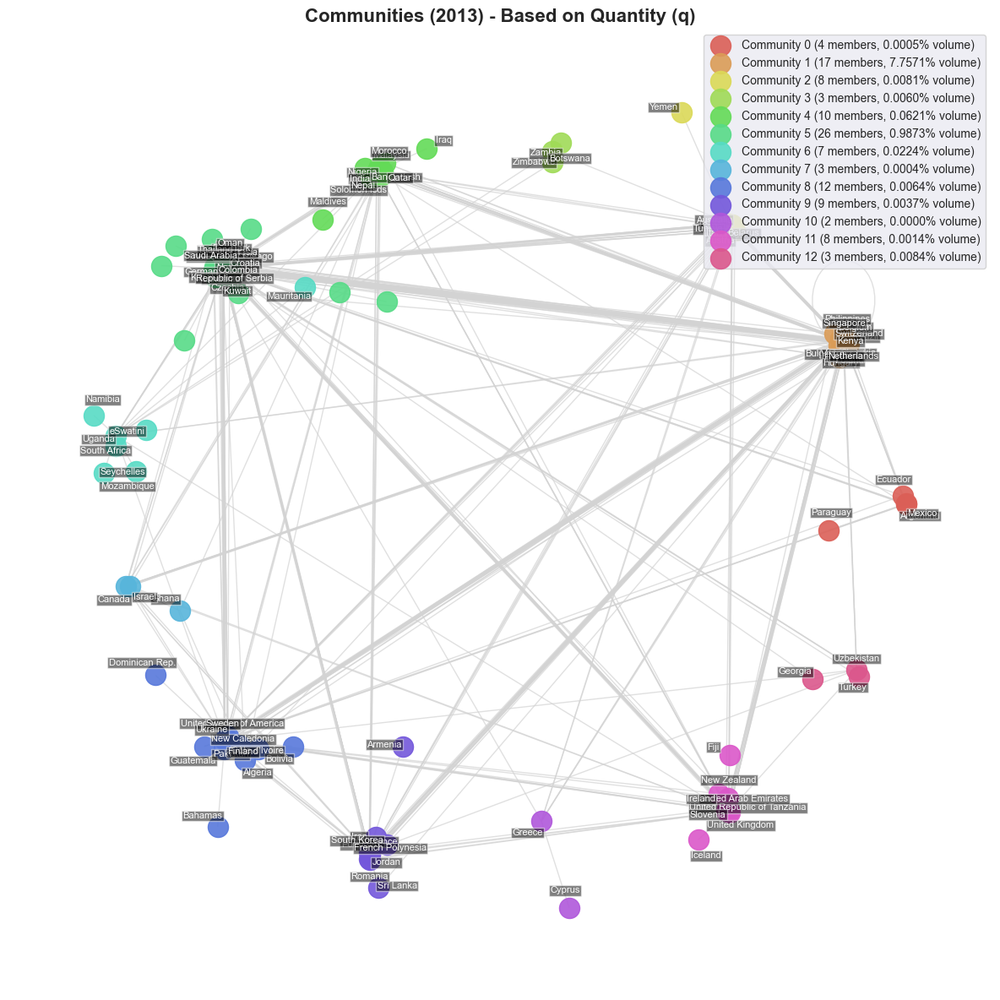

Top Countries by Community based on q for year 1.2883679649621218:
Community 0:
  Argentina | Mexico | Ecuador | Paraguay
Community 1:
  China | Belgium | Japan | Netherlands | Switzerland | Poland | Egypt | Singapore | Philippines | Estonia | Vietnam | Sudan | Hungary | Brazil | Bulgaria | Kenya | Slovakia
Community 2:
  Spain | Australia | Italy | Austria | Tunisia | Belarus | Cuba | Yemen
Community 3:
  Botswana | Zimbabwe | Zambia
Community 4:
  India | Malaysia | Morocco | Nigeria | Qatar | Solomon Isds | Nepal | Bangladesh | Iraq | Maldives
Community 5:
  Chile | Germany | Russia | Thailand | Saudi Arabia | Indonesia | Venezuela | Czechia | Colombia | Peru | Denmark | Lithuania | Kazakhstan | Trinidad and Tobago | Croatia | Kuwait | Norway | Republic of Serbia | Latvia | Oman
Community 6:
  South Africa | Uganda | Namibia | eSwatini | Seychelles | Mozambique | Mauritania
Community 7:
  Canada | Israel | Ghana
Community 8:
  United States of America | Sweden | Ukraine | Pakistan |

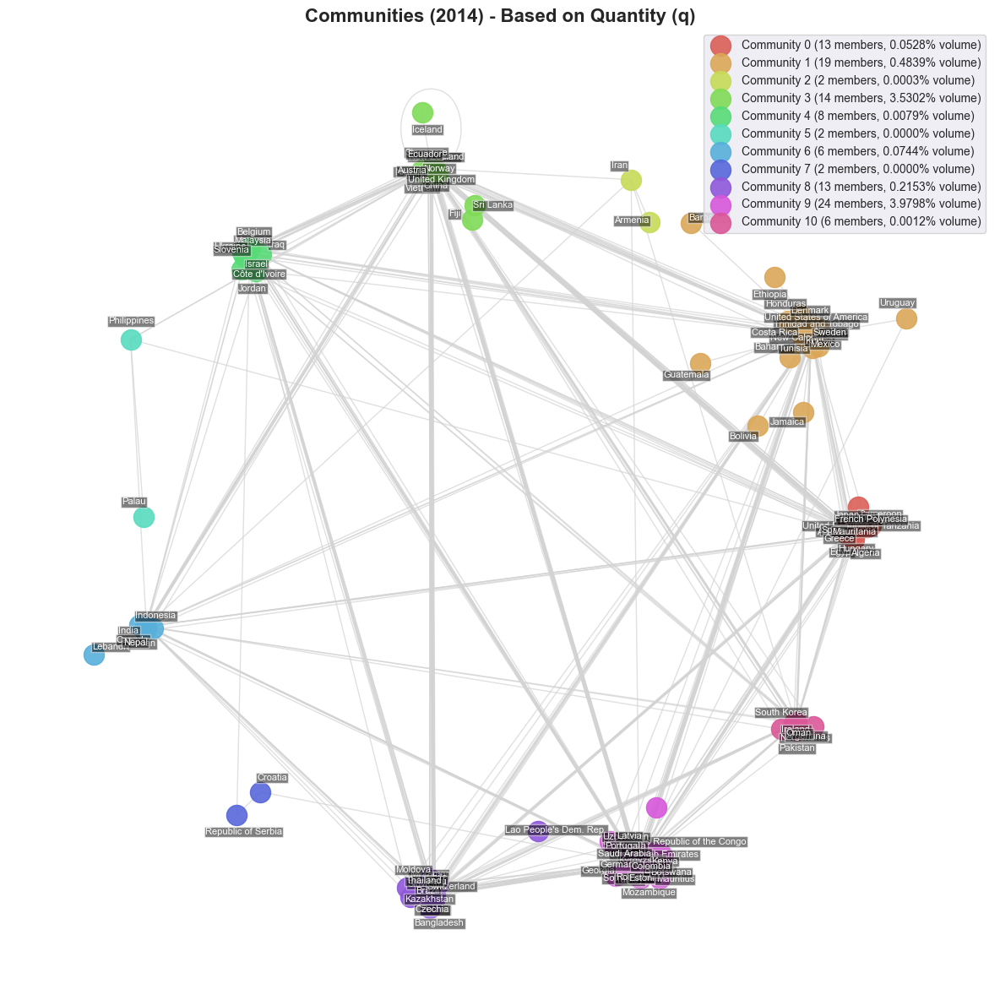

Top Countries by Community based on q for year 1.0972957121643476:
Community 0:
  Japan | France | Spain | Australia | Egypt | Venezuela | Greece | Algeria | Hungary | United Republic of Tanzania | Cameroon | Mauritania | French Polynesia
Community 1:
  United States of America | Mexico | Sweden | Denmark | Finland | Qatar | Trinidad and Tobago | New Caledonia | Kuwait | Tunisia | Honduras | Costa Rica | Bahamas | Ethiopia | Jamaica | Uruguay | Bolivia | Guatemala | Barbados
Community 2:
  Iran | Armenia
Community 3:
  China | United Kingdom | Singapore | Italy | Austria | Vietnam | Ecuador | Nigeria | Morocco | Norway | New Zealand | Iceland | Sri Lanka | Fiji
Community 4:
  Belgium | Slovenia | Ukraine | Israel | Malaysia | Iraq | Côte d'Ivoire | Jordan
Community 5:
  Philippines | Palau
Community 6:
  Canada | India | Indonesia | Sudan | Nepal | Lebanon
Community 7:
  Republic of Serbia | Croatia
Community 8:
  Chile | Thailand | Poland | Switzerland | Peru | Czechia | Bangladesh | 

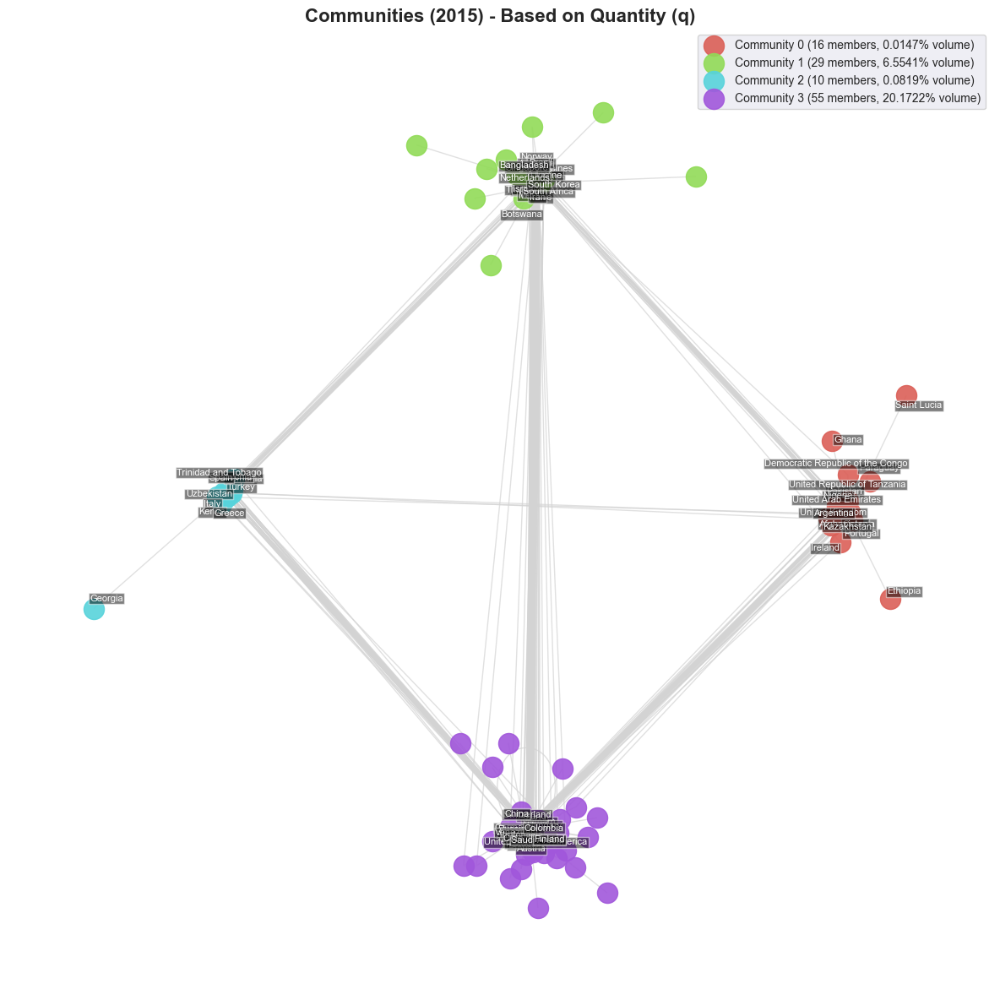

Top Countries by Community based on q for year -0.12869895816667062:
Community 0:
  Canada | United Arab Emirates | United Kingdom | Argentina | Portugal | Nigeria | United Republic of Tanzania | Pakistan | Afghanistan | Kazakhstan | Ireland | Democratic Republic of the Congo | Paraguay | Ghana | Ethiopia | Saint Lucia
Community 1:
  Japan | Chile | India | South Korea | Netherlands | South Africa | Thailand | Mexico | Australia | Iran | Egypt | Singapore | Ukraine | Kuwait | Philippines | Israel | Brazil | Norway | Bangladesh | Botswana
Community 2:
  Spain | Turkey | Italy | Czechia | Greece | Romania | Kenya | Uzbekistan | Trinidad and Tobago | Georgia
Community 3:
  United States of America | Belgium | Russia | China | Germany | France | Slovenia | Saudi Arabia | Sweden | Venezuela | Poland | Switzerland | Colombia | Austria | Morocco | Finland | Indonesia | Côte d'Ivoire | Vietnam | Hungary


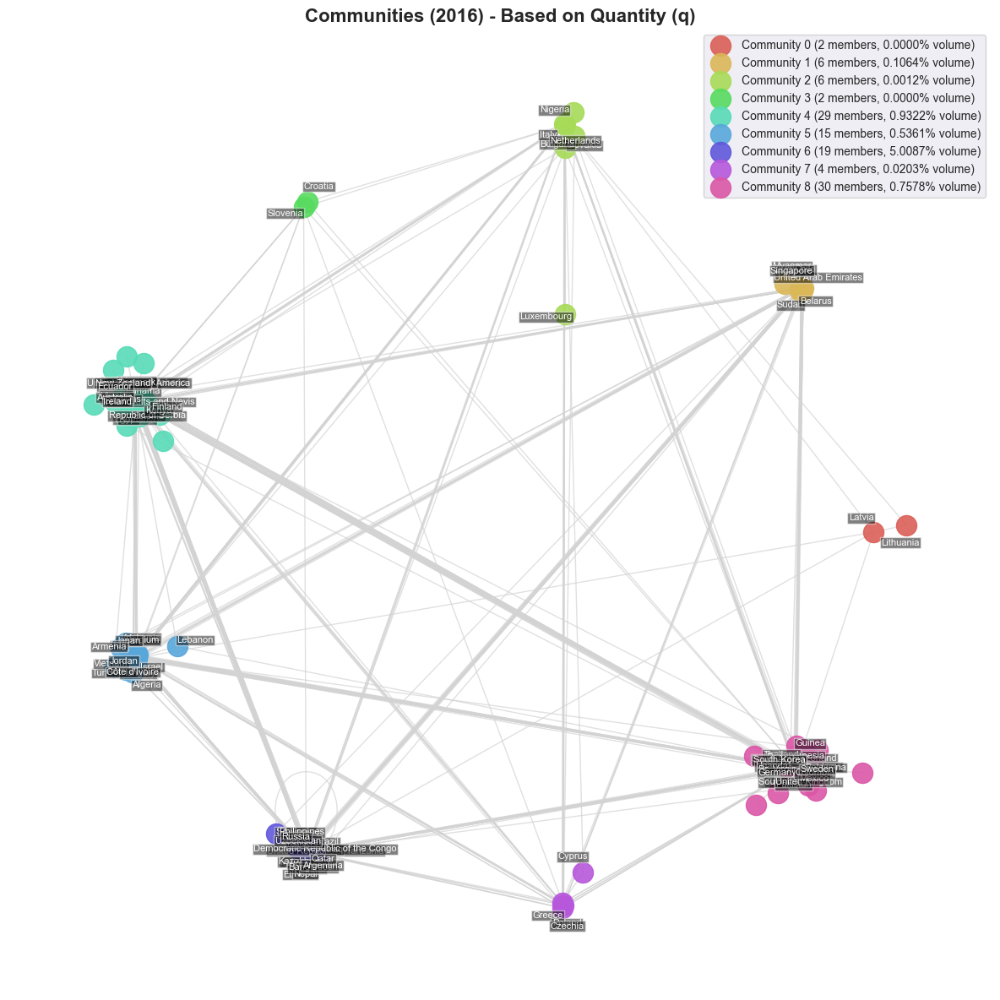

Top Countries by Community based on q for year -1.2809160864850135:
Community 0:
  Latvia | Lithuania
Community 1:
  Chile | United Arab Emirates | Singapore | Sudan | Belarus | Myanmar
Community 2:
  Netherlands | Italy | Bulgaria | Nigeria | Slovakia | Luxembourg
Community 3:
  Slovenia | Croatia
Community 4:
  United States of America | Spain | Australia | Ukraine | Egypt | Romania | Peru | Morocco | Republic of Serbia | Denmark | New Zealand | Kenya | Ecuador | Bahamas | Trinidad and Tobago | Ireland | Estonia | Panama | Finland | Saint Kitts and Nevis
Community 5:
  Belgium | Japan | France | Iran | Israel | Austria | Hungary | Malaysia | Armenia | Tunisia | Algeria | Vietnam | Jordan | Côte d'Ivoire | Lebanon
Community 6:
  Russia | China | India | Turkey | Argentina | Philippines | Brazil | Qatar | Nepal | United Republic of Tanzania | Ethiopia | Bangladesh | Uzbekistan | Kazakhstan | Democratic Republic of the Congo | Kuwait | Maldives | Iraq | Sri Lanka
Community 7:
  Poland |

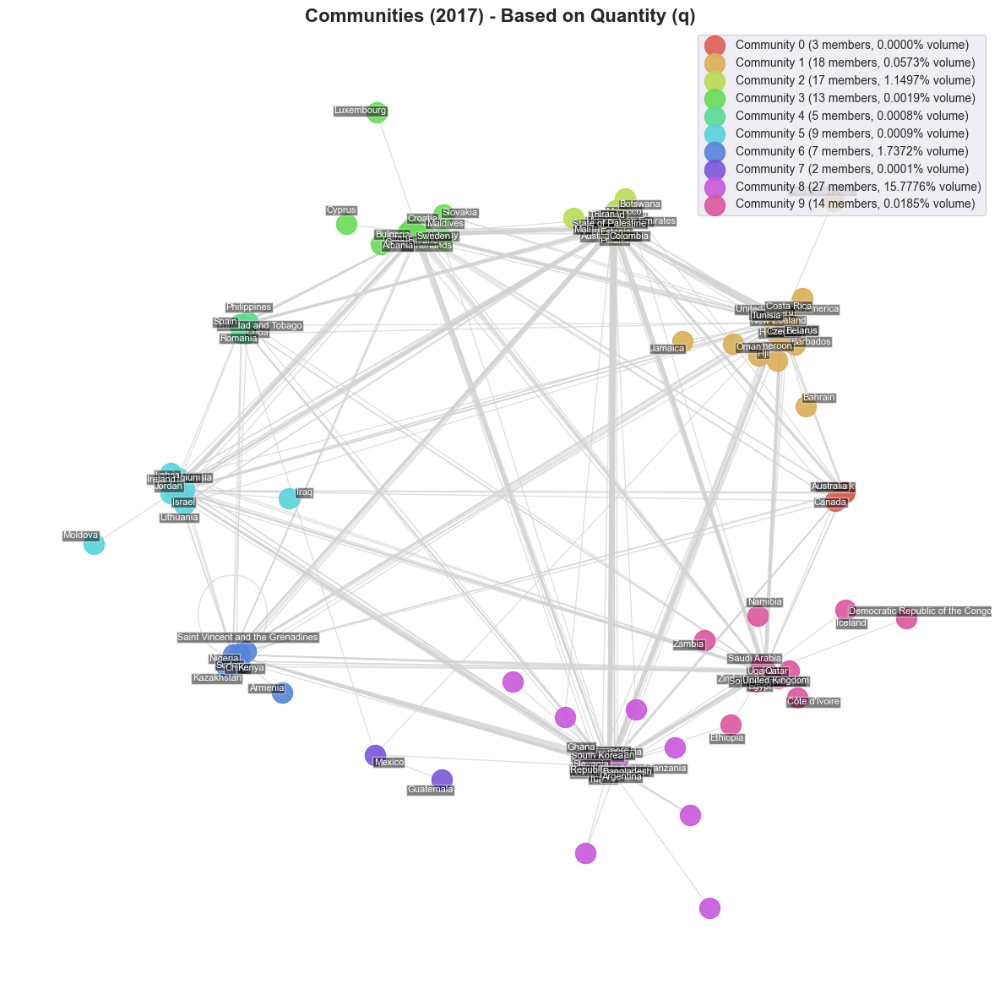

Top Countries by Community based on q for year 1.8187542281422187:
Community 0:
  Canada | Australia | Denmark
Community 1:
  United States of America | Czechia | Peru | Hungary | Pakistan | Tunisia | Belarus | Ecuador | New Zealand | Venezuela | Barbados | Fiji | Costa Rica | Cameroon | Oman | Bahrain | Jamaica | Dominican Rep.
Community 2:
  Russia | Germany | Thailand | United Arab Emirates | Poland | Iran | Switzerland | Algeria | Ukraine | Austria | Morocco | Colombia | Brazil | Estonia | State of Palestine | Botswana | Mali
Community 3:
  Netherlands | Sweden | Italy | Greece | Norway | Croatia | Bulgaria | Finland | Maldives | Slovakia | Albania | Cyprus | Luxembourg
Community 4:
  Spain | Romania | Philippines | Cuba | Trinidad and Tobago
Community 5:
  Belgium | Latvia | Israel | Malaysia | Ireland | Lithuania | Jordan | Moldova | Iraq
Community 6:
  China | Sudan | Kenya | Saint Vincent and the Grenadines | Nigeria | Kazakhstan | Armenia
Community 7:
  Mexico | Guatemala
Comm

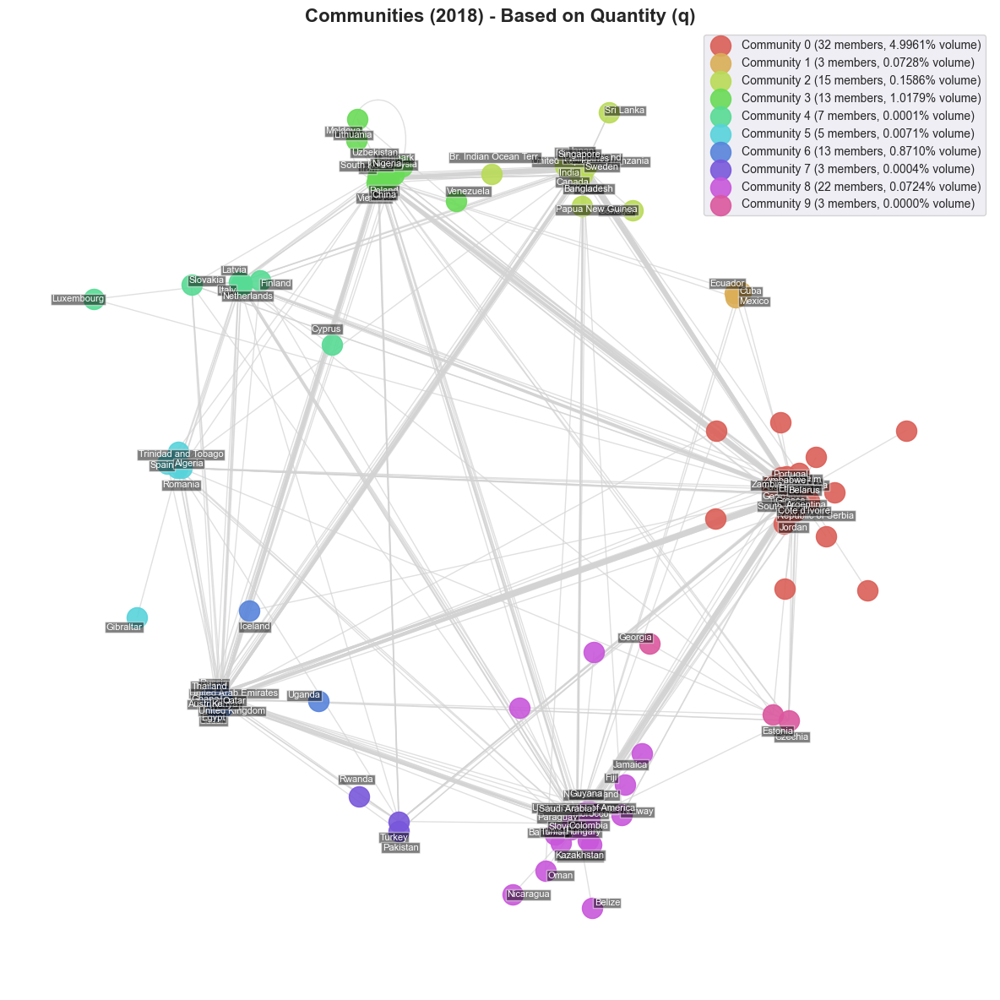

Top Countries by Community based on q for year 1.930735710495206:
Community 0:
  Chile | Belgium | Germany | France | Argentina | South Africa | Indonesia | Australia | Ukraine | Peru | Greece | Portugal | Bulgaria | Republic of Serbia | Zimbabwe | Côte d'Ivoire | Belarus | Jordan | Zambia | Ethiopia
Community 1:
  Mexico | Cuba | Ecuador
Community 2:
  Canada | Japan | India | Singapore | Sweden | Switzerland | Philippines | Kuwait | Bangladesh | United Republic of Tanzania | Myanmar | Papua New Guinea | Sri Lanka | Senegal | Br. Indian Ocean Terr.
Community 3:
  China | South Korea | Poland | Iran | Vietnam | Nepal | Uzbekistan | Malaysia | Denmark | Nigeria | Moldova | Lithuania | Venezuela
Community 4:
  Netherlands | Italy | Latvia | Finland | Slovakia | Cyprus | Luxembourg
Community 5:
  Spain | Romania | Trinidad and Tobago | Algeria | Gibraltar
Community 6:
  Russia | United Kingdom | United Arab Emirates | Thailand | Egypt | Austria | Qatar | Israel | Sudan | Kenya | Ghana | I

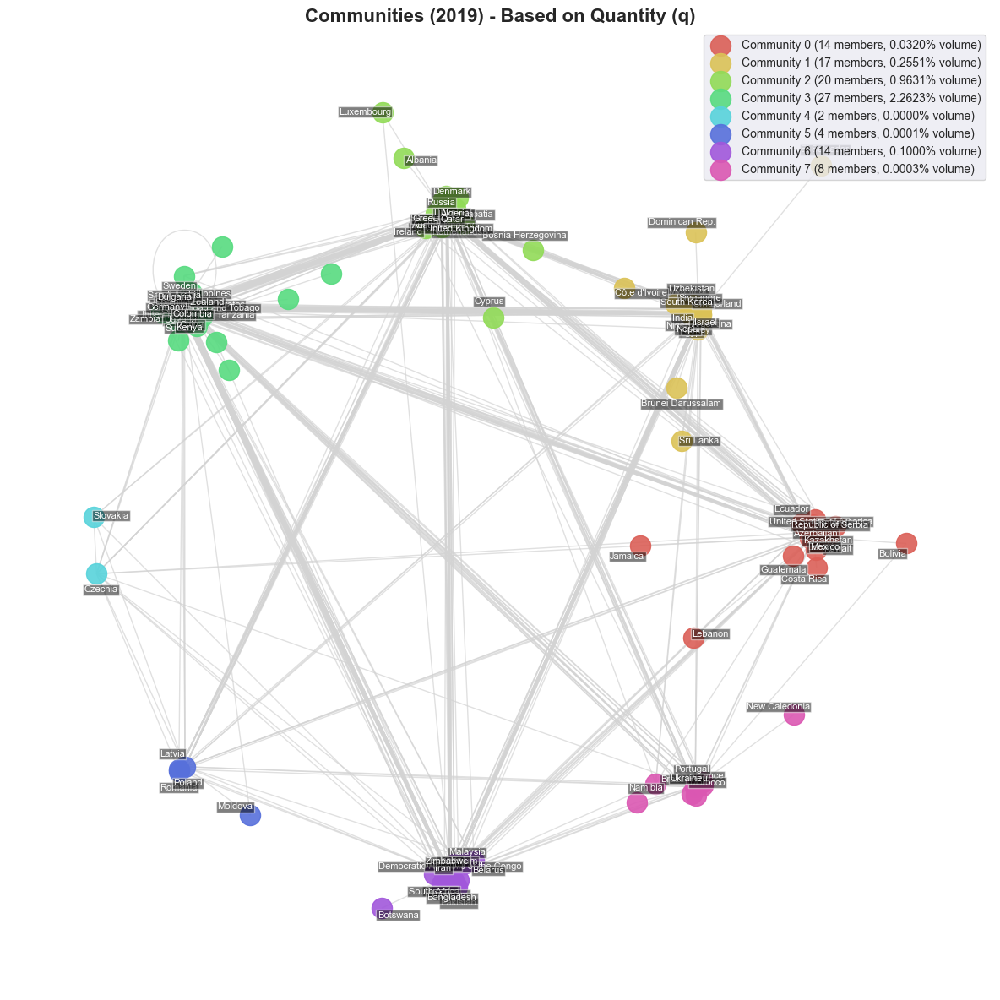

Top Countries by Community based on q for year 0.12511117169308:
Community 0:
  United States of America | Estonia | Mexico | Republic of Serbia | Azerbaijan | Kuwait | Finland | Ecuador | Kazakhstan | Guatemala | Costa Rica | Bolivia | Lebanon | Jamaica
Community 1:
  South Korea | India | Turkey | Singapore | Argentina | Switzerland | Egypt | Nepal | Israel | Uzbekistan | Nigeria | Myanmar | Côte d'Ivoire | Brunei Darussalam | Dominican Rep. | Sri Lanka | El Salvador
Community 2:
  Russia | Netherlands | United Kingdom | Slovenia | Italy | Austria | Denmark | Greece | Tunisia | Hungary | Qatar | Croatia | Algeria | Lithuania | Libya | Ireland | Albania | Bosnia Herzegovina | Cyprus | Luxembourg
Community 3:
  Chile | Germany | China | Spain | United Arab Emirates | Sweden | Saudi Arabia | Indonesia | Australia | Sudan | Colombia | United Republic of Tanzania | New Zealand | Ghana | Bulgaria | Kenya | Zambia | Trinidad and Tobago | Philippines | Uganda
Community 4:
  Czechia | Slovaki

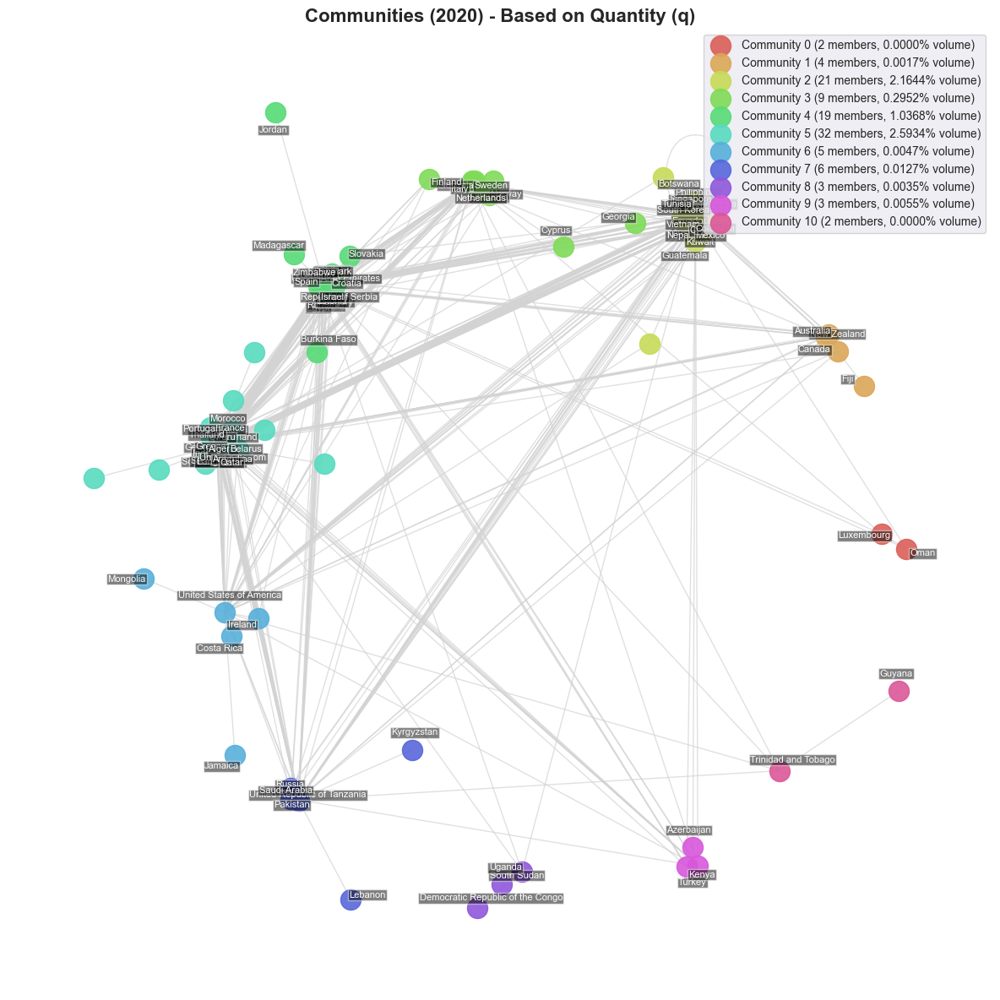

Top Countries by Community based on q for year 2.035322274842098:
Community 0:
  Oman | Luxembourg
Community 1:
  Canada | Australia | New Zealand | Fiji
Community 2:
  Japan | South Korea | China | Singapore | Iran | Austria | Philippines | Colombia | Mexico | Iraq | Vietnam | Kuwait | Cuba | Malaysia | Uzbekistan | Tunisia | Nepal | Ecuador | Guatemala | Botswana
Community 3:
  Netherlands | Sweden | Slovenia | Italy | Lithuania | Norway | Finland | Cyprus | Georgia
Community 4:
  Chile | Belgium | United Arab Emirates | Spain | Estonia | Romania | Israel | Egypt | Czechia | Denmark | Republic of Serbia | Ukraine | Zimbabwe | Hungary | Croatia | Slovakia | Madagascar | Burkina Faso | Jordan
Community 5:
  Germany | India | France | United Kingdom | Argentina | Switzerland | Poland | South Africa | Latvia | Indonesia | Thailand | Sudan | Greece | Portugal | Bangladesh | Morocco | Peru | Algeria | Qatar | Belarus
Community 6:
  United States of America | Costa Rica | Ireland | Mongolia

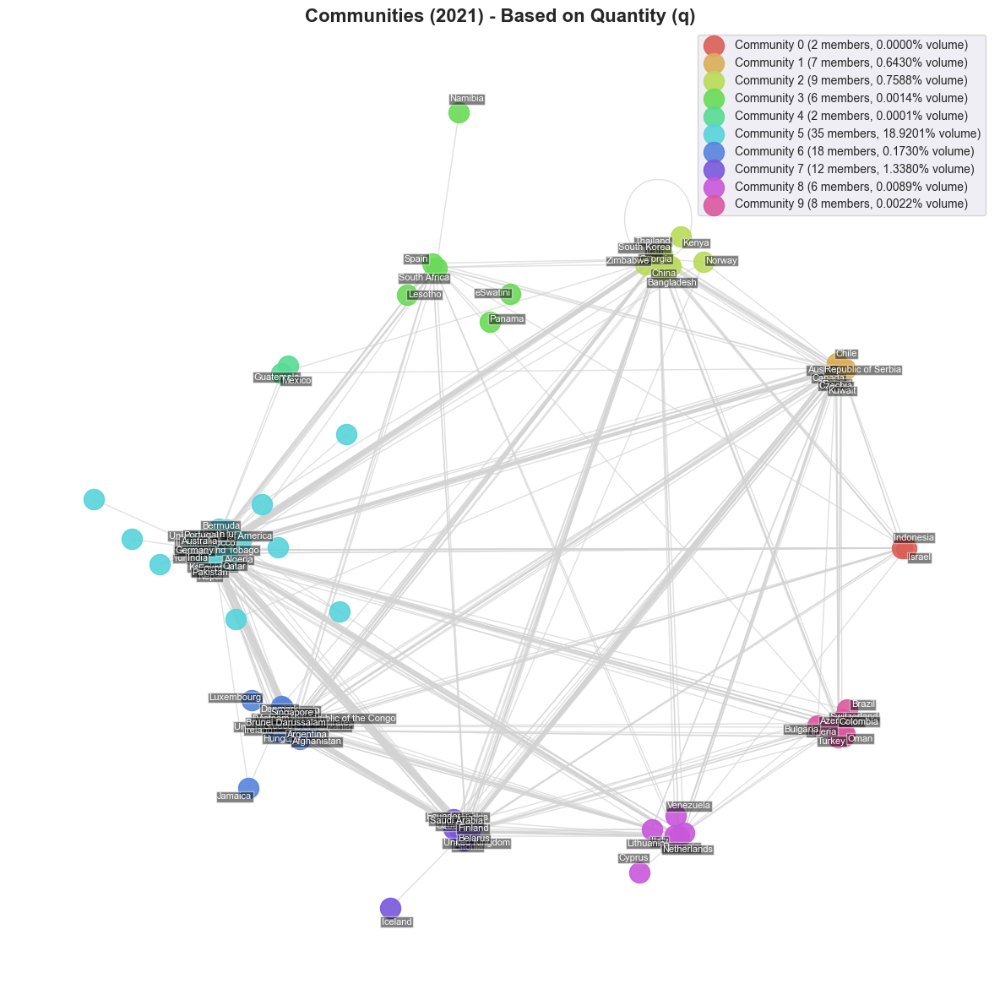

Top Countries by Community based on q for year 1.179044777440828:
Community 0:
  Indonesia | Israel
Community 1:
  Chile | Canada | Poland | Czechia | Republic of Serbia | Austria | Kuwait
Community 2:
  South Korea | China | Iran | Thailand | Georgia | Zimbabwe | Bangladesh | Kenya | Norway
Community 3:
  Spain | South Africa | Lesotho | eSwatini | Panama | Namibia
Community 4:
  Mexico | Guatemala
Community 5:
  United States of America | Japan | Germany | India | France | Australia | Egypt | Portugal | Peru | Ukraine | Sudan | Pakistan | Morocco | Nepal | Qatar | Tunisia | Kazakhstan | Trinidad and Tobago | Bermuda | Algeria
Community 6:
  Belgium | United Arab Emirates | Slovenia | Argentina | Singapore | Malaysia | Philippines | Hungary | Greece | Brunei Darussalam | Vietnam | Denmark | Afghanistan | Ireland | United Republic of Tanzania | Democratic Republic of the Congo | Luxembourg | Jamaica
Community 7:
  Russia | United Kingdom | Estonia | Latvia | Sweden | Saudi Arabia | Bel

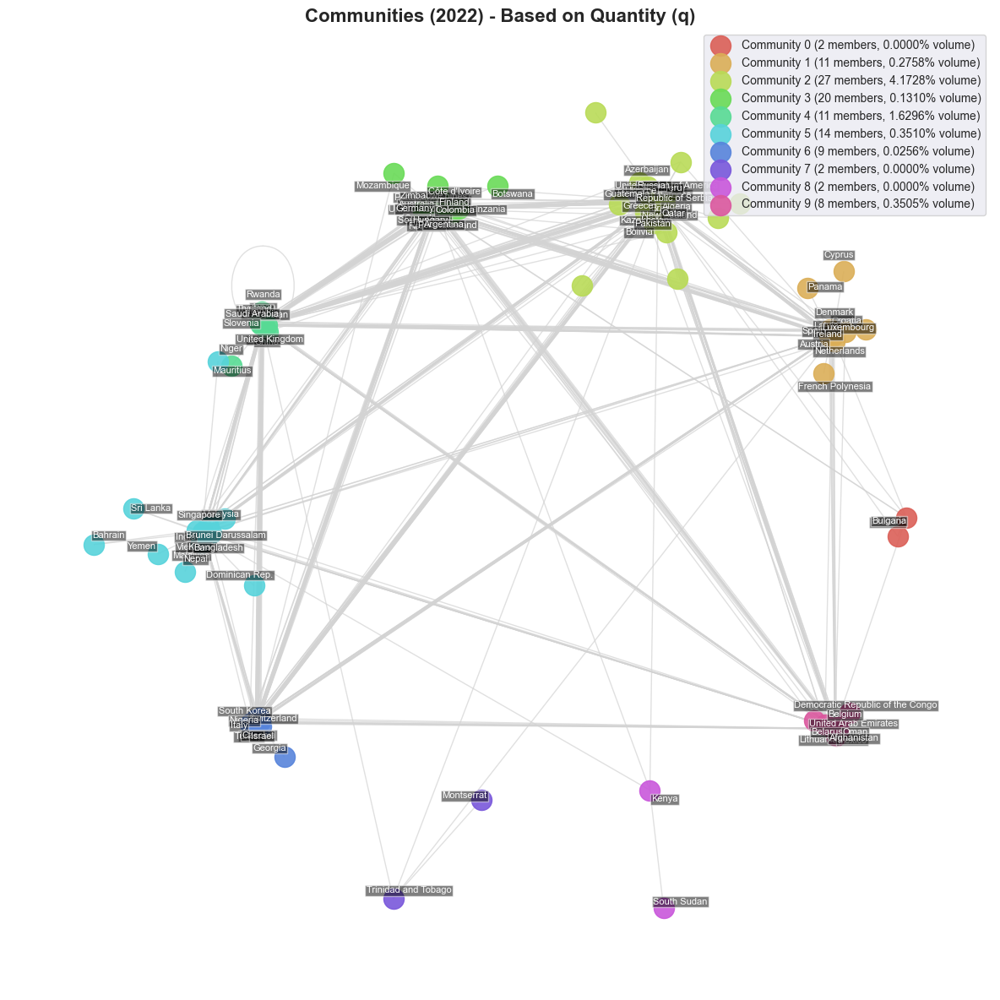

Top Countries by Community based on q for year 1.9440757424392487:
Community 0:
  Bulgaria | Ecuador
Community 1:
  Netherlands | Spain | Austria | Latvia | Croatia | Denmark | Ireland | Luxembourg | French Polynesia | Panama | Cyprus
Community 2:
  Chile | United States of America | Russia | Sweden | France | Ukraine | Greece | Qatar | Republic of Serbia | Kazakhstan | Morocco | Peru | Pakistan | Tunisia | Algeria | Brazil | Azerbaijan | Bolivia | Guatemala | New Zealand
Community 3:
  Poland | Germany | Canada | Argentina | South Africa | Indonesia | Australia | Romania | Colombia | Hungary | United Republic of Tanzania | Philippines | Zimbabwe | Portugal | Finland | Zambia | Côte d'Ivoire | Iceland | Mozambique | Botswana
Community 4:
  Japan | China | United Kingdom | Estonia | Thailand | Saudi Arabia | Slovenia | Iran | Uzbekistan | Rwanda | Niger
Community 5:
  India | Singapore | Vietnam | Kuwait | Malaysia | Bangladesh | Nepal | Brunei Darussalam | Maldives | Yemen | Sri Lanka 

In [27]:
##############################################
# Community Visualization
##############################################
sns.set_theme(style='darkgrid')

for y in years:
    G = yearly_graphs[y]
    if G.number_of_nodes() == 0:
        print(f"Year {y}: No nodes to plot.")
        continue

    # Community Detection
    if G.number_of_edges() > 0:
        partition = community_louvain.best_partition(G, weight='inverse_weight')
    else:
        partition = {n:0 for n in G.nodes()}

    communities = {}
    for n, c in partition.items():
        communities.setdefault(c, []).append(n)

    # Computation of Node Strenght based on the Volume "q"
    node_strengths = {}
    for n in G.nodes():
        strength = sum(d['weight'] for _,_,d in G.edges(n, data=True))
        node_strengths[n] = strength

    # Selection of Top Nodes per Community (Annotation and Summary Stats)
    top_per_community = {}
    top_n_per_comm = 20
    for c, nodes in communities.items():
        nodes_strength = [(n, node_strengths[n]) for n in nodes]
        nodes_strength.sort(key=lambda x:x[1], reverse=True)
        top_nodes_c = [x[0] for x in nodes_strength[:top_n_per_comm]]
        top_per_community[c] = top_nodes_c

    top_nodes = set()
    for c in top_per_community:
        top_nodes.update(top_per_community[c])

    pos = nx.spring_layout(G, seed=42, k=0.15, iterations=100)
    # pos = nx.shell_layout(G)

    num_com = len(communities)
    radius = 2.0
    angles = np.linspace(0, 2*math.pi, num_com, endpoint=False)
    offsets = [(radius*math.cos(a), radius*math.sin(a)) for a in angles]

    sorted_communities = sorted(communities.keys())
    palette = sns.color_palette("hls", num_com)
    community_colors = {}
    for i, c in enumerate(sorted_communities):
        community_colors[c] = palette[i]

    for i, c in enumerate(sorted_communities):
        nodes = communities[c]
        cx = np.mean([pos[n][0] for n in nodes])
        cy = np.mean([pos[n][1] for n in nodes])
        ox, oy = offsets[i]
        for n in nodes:
            pos[n] = (pos[n][0] - cx + ox, pos[n][1] - cy + oy)

    plt.figure(figsize=(12,12))
    plt.title(f"Communities ({y}) - Based on Quantity (q)", fontsize=16, fontweight='bold')

    nx.draw_networkx_edges(G, pos, edge_color='lightgray', alpha=0.7)

    # Computation of Community Shares of the Volume
    total_volume = sum(d['weight'] for _,_,d in G.edges(data=True))
    community_volumes = {}
    for c in sorted_communities:
        com_nodes = set(communities[c])
        com_volume = sum(d['weight'] for (u,v,d) in G.edges(data=True)
                         if u in com_nodes and v in com_nodes)
        community_volumes[c] = com_volume

    handles = []
    labels = []
    for c in sorted_communities:
        nodes = communities[c]
        scatter = nx.draw_networkx_nodes(G, pos, nodelist=nodes,
                                         node_color=[community_colors[c]],
                                         node_size=300, alpha=0.9)
        share = (community_volumes[c] / total_volume)*100 if total_volume > 0 else 0.0
        community_label = f"Community {c} ({len(nodes)} members, {share:.4f}% volume)"
        handles.append(scatter)
        labels.append(community_label)

    label_positions = {}
    top_nodes = list(top_nodes)
    for i, n in enumerate(top_nodes):
        x, y = pos[n]
        angle = 2*math.pi*(i/len(top_nodes))
        offset_dist = 0.10
        dx = offset_dist*math.cos(angle)
        dy = offset_dist*math.sin(angle)
        label_positions[n] = (x+dx, y+dy)

    nx.draw_networkx_labels(G, label_positions,
                            labels={n:n for n in top_nodes},
                            font_size=8, font_color='white',
                            bbox=dict(facecolor='black', alpha=0.5, pad=1))

    plt.axis('off')
    plt.legend(handles, labels, fontsize=10, loc='upper right', frameon=True)
    plt.tight_layout()
    plt.show()

    print(f"Top Countries by Community based on q for year {y}:")
    for c in sorted_communities:
        print(f"Community {c}:\n  {' | '.join(top_per_community[c])}")

### GCNConv Communities

In [28]:
############################################################
# Parameters (Base defaults)
############################################################
start_year = 2002
end_year = 2022
top_percent = 0.4
edge_volume_threshold = 0.0001
log_transform = True
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

############################################################
# Node and Edge Features
############################################################
node_features = [
    'avg_gdpcap_exp',
    'avg_gdpcap_imp',
    'wto_member',
    'eu_member',
    'avg_pop'
]

edge_feature_cols = [
    "diplo_disagreement",  
    "q",                  
    "v",
    "comrelig",           
    "comlang_off",        
    "distw_harmonic",     
    "pop_o",              
    "pop_d",              
    "gatt_o",             
    "gatt_d",             
    "wto_o",              
    "wto_d",              
    "eu_o",               
    "eu_d",               
    "fta_wto",            
    "tradeflow_baci",     
    "tradeflow_imf_o",    
    "tradeflow_imf_d",
    "total_trade_v"  
]

Using device: cpu


In [29]:
############################################################
# Helper Functions
############################################################
def filter_top_countries(df: pd.DataFrame, top_percent: float = 0.5):
    """
    Filter the DataFrame to include only the top `top_percent` of countries by total trade volume.

    Parameters
    ----------
    df : pd.DataFrame
        The input dataframe with at least 'export_country', 'import_country', and 'v'.
    top_percent : float
        Fraction of countries to keep. For example, 0.5 means keep top 50% countries by trade volume.

    Returns
    -------
    pd.DataFrame
        A filtered DataFrame including only the top-percent countries.
    """
    exp_sum = df.groupby('export_country')['v'].sum()
    imp_sum = df.groupby('import_country')['v'].sum()
    total_trade = exp_sum.add(imp_sum, fill_value=0).sort_values(ascending=False)
    cutoff_index = int(len(total_trade)*top_percent)
    cutoff_countries = total_trade.index[:cutoff_index]
    df_filtered = df[df['export_country'].isin(cutoff_countries) & df['import_country'].isin(cutoff_countries)].copy()
    return df_filtered

def compute_total_trade_volume(df: pd.DataFrame):
    """
    Compute the total trade volume per (t, export_country, import_country) group and add it as 'total_trade_v'.

    Parameters
    ----------
    df : pd.DataFrame
        The input dataframe with 't', 'export_country', 'import_country', and 'v'.

    Returns
    -------
    pd.DataFrame
        A DataFrame with an additional 'total_trade_v' column.
    """
    grouped = df.groupby(['t', 'export_country', 'import_country'], as_index=False)['v'].sum()
    grouped.rename(columns={'v': 'total_trade_v'}, inplace=True)
    df = df.merge(grouped, on=['t','export_country','import_country'], how='left')
    df['total_trade_v'] = df['total_trade_v'].fillna(0.0)
    return df

def build_node_df(df, all_countries):
    """
    Build a node-level feature DataFrame, aggregating country-level attributes over all their edges.

    Parameters
    ----------
    df : pd.DataFrame
        Input DataFrame filtered for relevant countries and time.
    all_countries : array-like
        List of all countries to ensure consistent indexing.

    Returns
    -------
    pd.DataFrame
        DataFrame indexed by countries with aggregated node-level features.
    """
    node_df = pd.DataFrame(index=all_countries)
    node_df['avg_gdpcap_exp'] = df.groupby('export_country')['gdpcap_d'].mean()
    node_df['avg_gdpcap_imp'] = df.groupby('import_country')['gdpcap_o'].mean()

    wto_members = set(df[df['wto_o'] == 1]['export_country']) | set(df[df['wto_d'] == 1]['import_country'])
    eu_members = set(df[df['eu_o'] == 1]['export_country']) | set(df[df['eu_d'] == 1]['import_country'])

    node_df['wto_member'] = node_df.index.map(lambda c: 1.0 if c in wto_members else 0.0)
    node_df['eu_member'] = node_df.index.map(lambda c: 1.0 if c in eu_members else 0.0)
    node_df['avg_pop'] = df.groupby('export_country')['pop_o'].mean()

    node_df = node_df.fillna(0.0)
    for c in all_countries:
        if c not in node_df.index:
            node_df.loc[c] = [0,0,0,0,0]
    return node_df

def build_smoothed_snapshot(df, all_countries, year, window_size, node_features, edge_feature_cols, prev_embeddings, device, log_transform=True, edge_volume_threshold=0.0001):
    """
    Construct a single temporal snapshot (Data object) for a given year by aggregating data from a time window,
    preprocessing node and edge features, and incorporating previous year's embeddings into node features.

    Parameters
    ----------
    df : pd.DataFrame
        Filtered DataFrame with relevant columns.
    all_countries : array-like
        List of all countries.
    year : int
        The current year to build a snapshot for.
    window_size : int
        How many years back (including current) to aggregate for smoothing.
    node_features : list of str
        Node-level feature names.
    edge_feature_cols : list of str
        Edge-level feature names.
    prev_embeddings : np.ndarray or None
        Previous year's node embeddings to incorporate, or None if no previous embeddings available.
    device : torch.device
        The device (CPU/GPU) to place tensors on.
    log_transform : bool
        Whether to log-transform the normalized 'v' values.
    edge_volume_threshold : float
        Threshold to filter edges by volume after normalization.

    Returns
    -------
    Data
        A PyTorch Geometric Data object representing the snapshot.
    """
    start_yr = max(df['t'].min(), year - window_size + 1)
    df_window = df[(df['t'] >= start_yr) & (df['t'] <= year)].copy()

    df_window['yearly_total_v'] = df_window.groupby('t')['v'].transform('sum')
    df_window['v'] = df_window['v'] / (df_window['yearly_total_v'] + 1e-9)
    if log_transform:
        df_window['v'] = np.log1p(df_window['v'])

    node_df = build_node_df(df_window, all_countries)
    base_node_mat = node_df[node_features].values
    scaler_node = StandardScaler()
    base_node_mat = scaler_node.fit_transform(base_node_mat)

    if prev_embeddings is not None:
        node_mat = np.hstack([base_node_mat, prev_embeddings])
    else:
        zero_emb = np.zeros((len(all_countries), embedding_dim))
        node_mat = np.hstack([base_node_mat, zero_emb])

    for col in edge_feature_cols:
        df_window[col] = pd.to_numeric(df_window[col], errors='coerce').fillna(0.0)
    scaler_edge = StandardScaler()
    scaler_edge.fit(df_window[edge_feature_cols])

    sub_edge_mat = df_window[edge_feature_cols].values
    sub_edge_mat = scaler_edge.transform(sub_edge_mat)

    country_to_id = {c: i for i, c in enumerate(all_countries)}
    src = df_window['export_country'].map(country_to_id).values
    dst = df_window['import_country'].map(country_to_id).values

    v_idx = edge_feature_cols.index('v')
    mask = sub_edge_mat[:,v_idx] > np.log1p(edge_volume_threshold)
    src = src[mask]
    dst = dst[mask]
    sub_edge_mat = sub_edge_mat[mask]

    x = torch.tensor(node_mat, dtype=torch.float, device=device)
    if len(src) == 0:
        data = Data(x=x, edge_index=torch.empty((2,0), dtype=torch.long, device=device))
        return data

    edge_index = torch.tensor([src, dst], dtype=torch.long, device=device)
    edge_attr = torch.tensor(sub_edge_mat, dtype=torch.float, device=device)
    edge_index, edge_attr = to_undirected(edge_index, edge_attr=edge_attr, reduce='mean')

    data = Data(x=x, edge_index=edge_index, edge_attr=edge_attr)
    return data


def compute_edge_weight(edge_vec: np.ndarray, edge_feature_cols: list) -> float:
    """
    Compute a single edge weight from multiple edge features via a logistic transform 
    of a linear combination of selected variables.

    This function treats each feature as having a certain 'importance' (coefficient) 
    in determining the overall tie strength between two nodes. Specifically:
    1. Identifies feature indices (trade volume, distance, FTA presence, diplomatic disagreement, 
       and common language).
    2. Builds a linear score by multiplying each feature by a user-defined coefficient.
    3. Applies the logistic (sigmoid) function to map the linear score into the (0,1) range.

    Parameters
    ----------
    edge_vec : np.ndarray
        A one-dimensional array containing the normalized/scaled values of the 
        edge features for a single edge.
    edge_feature_cols : list of str
        The list of all edge feature column names corresponding to the order of values 
        in `edge_vec`.

    Returns
    -------
    float
        A scalar weight value in the (0,1) range, where a higher value indicates a 
        stronger connection between the two nodes.
    """
    idx_v      = edge_feature_cols.index('v')
    idx_dist   = edge_feature_cols.index('distw_harmonic')
    idx_fta    = edge_feature_cols.index('fta_wto')
    idx_diplo  = edge_feature_cols.index('diplo_disagreement')
    idx_lang   = edge_feature_cols.index('comlang_off')

    trade_vol = edge_vec[idx_v]        
    distance  = edge_vec[idx_dist]     
    fta       = edge_vec[idx_fta]
    diplo_dis = edge_vec[idx_diplo]
    lang      = edge_vec[idx_lang]

    alpha_v    = 1.0
    alpha_dist = -1.0
    alpha_fta  = 1.0 
    alpha_dipl = -0.5
    alpha_lang = 0.5

    linear_score = (
          alpha_v    * trade_vol
        + alpha_dist * distance
        + alpha_fta  * fta
        + alpha_dipl * diplo_dis
        + alpha_lang * lang
    )

    weight = 1.0 / (1.0 + np.exp(-linear_score))

    return float(weight)

In [30]:
##############################
# Visualization Functions
##############################
def plot_community_sizes_over_time(temporal_membership, years_of_interest):
    """
    Plot the size of each community over time using a line plot.

    Parameters
    ----------
    temporal_membership : list of arrays
        Each element corresponds to a timeslice and contains community assignments for each node.
    years_of_interest : list of int
        The years corresponding to each timeslice.

    Returns
    -------
    None
        Displays a matplotlib plot.
    """
    all_labels = set()
    for mem in temporal_membership:
        all_labels.update(mem)
    all_labels = sorted(all_labels)

    data = []
    for mem in temporal_membership:
        counts = np.bincount(mem, minlength=max(all_labels)+1)
        row = [counts[c] if c<len(counts) else 0 for c in all_labels]
        data.append(row)

    df = pd.DataFrame(data, index=years_of_interest, columns=[f"C{c}" for c in all_labels])
    plt.figure(figsize=(10,6))
    for c in df.columns:
        plt.plot(df.index, df[c], marker='o', label=c)

    plt.title("Community Sizes Over Time")
    plt.xlabel("Year")
    plt.ylabel("Number of Nodes")
    plt.legend(title="Community", ncol=2)
    plt.grid(True)
    plt.savefig(os.path.join(export_path, "gcnconv_community_sizes_over_time"), dpi=300, bbox_inches='tight')
    plt.show()

def plot_community_stacked_area(temporal_membership, years_of_interest):
    """
    Plot a stacked area chart showing community composition over time.

    Parameters
    ----------
    temporal_membership : list of arrays
        Each element corresponds to a timeslice and contains community assignments for each node.
    years_of_interest : list of int
        The years corresponding to each timeslice.

    Returns
    -------
    None
        Displays a matplotlib stacked area plot.
    """
    all_labels = set()
    for mem in temporal_membership:
        all_labels.update(mem)
    all_labels = sorted(all_labels)

    data = []
    for mem in temporal_membership:
        counts = np.bincount(mem, minlength=max(all_labels)+1)
        row = [counts[c] if c<len(counts) else 0 for c in all_labels]
        data.append(row)

    df = pd.DataFrame(data, index=years_of_interest, columns=[f"C{c}" for c in all_labels])
    plt.figure(figsize=(10,6))
    plt.stackplot(df.index, df.T, labels=df.columns)
    plt.title("Community Composition Over Time (Stacked Area)")
    plt.xlabel("Year")
    plt.ylabel("Number of Nodes")
    plt.legend(title="Community", ncol=2)
    plt.savefig(os.path.join(export_path, "gcnconv_community_stacked_area"), dpi=300, bbox_inches='tight')
    plt.show()

def plot_node_community_heatmap(temporal_membership, years_of_interest):
    """
    Display a heatmap of node vs. time community assignments.
    Rows represent nodes, columns represent years, and values are communities.

    Parameters
    ----------
    temporal_membership : list of arrays
        Each array is a timeslice community assignment.
    years_of_interest : list of int
        The years corresponding to each timeslice.

    Returns
    -------
    None
        Displays a seaborn heatmap.
    """
    all_nodes = set()
    for mem in temporal_membership:
        all_nodes.update(range(len(mem)))
    all_nodes = sorted(all_nodes)
    node_to_index = {node:i for i,node in enumerate(all_nodes)}

    num_time_slices = len(temporal_membership)
    node_community_matrix = np.full((len(all_nodes), num_time_slices), -1)
    for t, mem in enumerate(temporal_membership):
        for node, comm in enumerate(mem):
            node_community_matrix[node_to_index[node], t] = comm

    plt.figure(figsize=(14,8))
    sns.heatmap(
        node_community_matrix,
        cmap="tab20",
        cbar_kws={"label": "Community"},
        xticklabels=years_of_interest,
        yticklabels=False,
        linewidths=0.1,
        linecolor="gray"
    )
    plt.xlabel("Year")
    plt.ylabel("Nodes (sorted by dominant community)")
    plt.title("Community Membership Evolution Over Time")
    for t in range(num_time_slices-1):
        plt.axvline(t+0.5, color="black", linestyle="--", linewidth=0.5)
    plt.savefig(os.path.join(export_path, "gcnconv_community_heatmap"), dpi=300, bbox_inches='tight')
    plt.show()

def plot_top_countries_heatmap(temporal_membership, snapshots, years_of_interest, top_n=30):
    """
    Display a heatmap for the top N countries (by total edge weight) over time, showing their community assignments.

    Parameters
    ----------
    temporal_membership : list of arrays
        Each element corresponds to a timeslice and contains community assignments for each node.
    snapshots : list of igraph.Graph
        The snapshots produced by the temporal slicing.
    years_of_interest : list of int
        The years corresponding to each timeslice.
    top_n : int
        Number of top countries to display based on total edge weight.

    Returns
    -------
    Nonex
        Displays a seaborn heatmap with discrete colormap for present communities only.
    """
    node_to_country = {v.index: v["_nx_name"] for snapshot in snapshots for v in snapshot.vs}

    v_attr = "weight"
    node_weights = {}
    last_snapshot = snapshots[-1]
    if last_snapshot.ecount() > 0:
        for e in last_snapshot.es:
            w = e[v_attr] if v_attr in last_snapshot.edge_attributes() else 0
            s = e.source
            t = e.target
            node_weights[s] = node_weights.get(s, 0) + w
            node_weights[t] = node_weights.get(t, 0) + w

    most_relevant_nodes = sorted(node_weights, key=node_weights.get, reverse=True)[:top_n]
    most_relevant_countries = [node_to_country[node] for node in most_relevant_nodes]

    most_relevant_indices = {node: idx for idx, node in enumerate(most_relevant_nodes)}

    num_time_slices = len(temporal_membership)
    node_community_matrix_relevant = np.full((len(most_relevant_nodes), num_time_slices), -1)
    for t, mem in enumerate(temporal_membership):
        for node, comm in enumerate(mem):
            if node in most_relevant_indices:
                node_community_matrix_relevant[most_relevant_indices[node], t] = comm

    unique_comms = np.unique(node_community_matrix_relevant[node_community_matrix_relevant >= 0])
    unique_comms = np.sort(unique_comms)

    from matplotlib.colors import ListedColormap, BoundaryNorm
    base_cmap = plt.cm.get_cmap("tab20", len(unique_comms))
    boundaries = np.arange(len(unique_comms) + 1) - 0.5
    norm = BoundaryNorm(boundaries, base_cmap.N)

    plt.figure(figsize=(14,8))
    masked_data = np.ma.masked_where(node_community_matrix_relevant < 0, node_community_matrix_relevant)

    ax = sns.heatmap(
        masked_data,
        cmap=base_cmap,
        norm=norm,
        cbar_kws={"label": "Community"},
        xticklabels=years_of_interest,
        yticklabels=most_relevant_countries,
        linewidths=0.1,
        linecolor="gray"
    )
    plt.xlabel("Year")
    plt.ylabel("Top Countries (sorted by last-snapshot edge weight)")
    plt.title(f"Community Membership Evolution Over Time (Top {top_n} by Last Snapshot Edge Weight)")

    cbar = ax.collections[0].colorbar
    cbar.set_ticks(np.arange(len(unique_comms)))
    cbar.set_ticklabels(unique_comms)

    for t in range(num_time_slices - 1):
        plt.axvline(t + 0.5, color="black", linestyle="--", linewidth=0.5)
    plt.savefig(os.path.join(export_path, "gcnconv_community_heatmap_top_n"), dpi=300, bbox_inches='tight')
    plt.show()
    
    
def visualize_communities_per_year(snapshots, temporal_membership, years_of_interest, all_countries, top_n_per_comm=20):
    """
    Visualize the communities for each year snapshot. This function:
    - Converts igraph snapshots to NetworkX graphs
    - Applies community assignments from temporal_membership
    - Calculates node strengths and identifies top nodes
    - Plots a network layout showing communities, edges, and top nodes

    Parameters
    ----------
    snapshots : list of igraph.Graph
        The yearly snapshots produced by run_temporal_community_detection.
    temporal_membership : list of arrays
        Each element corresponds to a timeslice and contains community assignments for each node.
    years_of_interest : list of int
        The years corresponding to each timeslice.
    all_countries : array-like
        The list of countries corresponding to nodes.
    top_n_per_comm : int, optional
        Number of top nodes to annotate per community, by default 20.

    Returns
    -------
    None
        Displays plots and prints community stats.
    """

    yearly_graphs = {}
    for i, year in enumerate(years_of_interest):
        ig_graph = snapshots[i]
        G = nx.Graph()
        G.add_nodes_from([v["_nx_name"] for v in ig_graph.vs])
        for e in ig_graph.es:
            u = ig_graph.vs[e.source]["_nx_name"]
            v = ig_graph.vs[e.target]["_nx_name"]
            w = e["weight"] if "weight" in ig_graph.edge_attributes() else 1.0
            G.add_edge(u, v, weight=w)
        yearly_graphs[year] = G

    for i, year in enumerate(years_of_interest):
        G = yearly_graphs[year]
        if G.number_of_nodes() == 0:
            print(f"Year {year}: No nodes to plot.")
            continue

        partition = {all_countries[node_idx]: comm_id 
                     for node_idx, comm_id in enumerate(temporal_membership[i]) 
                     if all_countries[node_idx] in G.nodes()}

        communities = {}
        for n, c in partition.items():
            communities.setdefault(c, []).append(n)

        node_strengths = {}
        for n in G.nodes():
            strength = sum(d['weight'] for _,_,d in G.edges(n, data=True))
            node_strengths[n] = strength

        top_per_community = {}
        for c, nodes in communities.items():
            nodes_strength = [(n, node_strengths[n]) for n in nodes]
            nodes_strength.sort(key=lambda x:x[1], reverse=True)
            top_nodes_c = [x[0] for x in nodes_strength[:top_n_per_comm]]
            top_per_community[c] = top_nodes_c

        top_nodes = set()
        for c in top_per_community:
            top_nodes.update(top_per_community[c])

        sns.set_theme(style='whitegrid')
        
        pos = nx.kamada_kawai_layout(G)

        num_com = len(communities)
        radius = 3.0
        angles = np.linspace(0, 2*math.pi, num_com, endpoint=False)
        offsets = [(radius*math.cos(a), radius*math.sin(a)) for a in angles]

        sorted_communities = sorted(communities.keys())
        palette = sns.color_palette("Set2", num_com)
        community_colors = {c: palette[idx] for idx, c in enumerate(sorted_communities)}

        for idx, c in enumerate(sorted_communities):
            nodes_c = communities[c]
            cx = np.mean([pos[n][0] for n in nodes_c])
            cy = np.mean([pos[n][1] for n in nodes_c])
            ox, oy = offsets[idx]
            for n in nodes_c:
                pos[n] = (pos[n][0] - cx + ox, pos[n][1] - cy + oy)

        plt.figure(figsize=(16,16))
        plt.title(f"Communities ({year}) - Based on Quantity (q)", fontsize=20, fontweight='bold')

        nx.draw_networkx_edges(G, pos, edge_color='gray', alpha=0.5)

        total_volume = sum(d['weight'] for _,_,d in G.edges(data=True))
        community_volumes = {}
        for c in sorted_communities:
            com_nodes = set(communities[c])
            com_volume = sum(d['weight'] for (u,v,d) in G.edges(data=True)
                             if u in com_nodes and v in com_nodes)
            community_volumes[c] = com_volume

        handles = []
        labels = []
        for c in sorted_communities:
            nodes_c = communities[c]
            scatter = nx.draw_networkx_nodes(G, pos, nodelist=nodes_c,
                                             node_color=[community_colors[c]],
                                             node_size=400, alpha=0.9)
            share = (community_volumes[c] / total_volume)*100 if total_volume > 0 else 0.0
            community_label = f"Community {c} ({len(nodes_c)} members, {share:.2f}% volume)"
            handles.append(scatter)
            labels.append(community_label)

        label_positions = {}
        top_nodes_list = list(top_nodes)
        for j, n in enumerate(top_nodes_list):
            x, y = pos[n]
            angle = 2*math.pi*(j/len(top_nodes_list))
            offset_dist = 0.15
            dx = offset_dist*math.cos(angle)
            dy = offset_dist*math.sin(angle)
            label_positions[n] = (x+dx, y+dy)

        nx.draw_networkx_labels(G, label_positions,
                                labels={n:n for n in top_nodes_list},
                                font_size=10, font_color='black',
                                bbox=dict(facecolor='white', alpha=0.8, edgecolor='none', pad=2))

        plt.axis('off')
        plt.legend(handles, labels, fontsize=12, loc='upper right', frameon=True)
        plt.tight_layout()
        plt.show()

        print(f"Top Countries by Community based on q for year {year}:")
        for c in sorted_communities:
            print(f"Community {c}:\n  {' | '.join(top_per_community[c])}")

In [31]:
############################################################
# Model Components and Alignment Functions
############################################################
class GCNEncoder(nn.Module):
    """
    A simple GCN encoder for node embeddings.

    Parameters
    ----------
    in_channels : int
        Dimension of input node features.
    hidden_channels : int
        Number of hidden units in the first GCN layer.
    out_channels : int
        Dimension of output embeddings.
    """
    def __init__(self, in_channels, hidden_channels, out_channels):
        super().__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv2 = GCNConv(hidden_channels, out_channels)

    def forward(self, x, edge_index):
        """
        Forward pass of the GCN encoder.

        Parameters
        ----------
        x : torch.Tensor
            Node feature matrix.
        edge_index : torch.LongTensor
            Edge indices of the graph.

        Returns
        -------
        torch.Tensor
            Node embeddings after GCN layers.
        """
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = self.conv2(x, edge_index)
        return x

def align_embeddings(ref_emb, target_emb):
    """
    Align target embeddings to a reference embedding space using Procrustes alignment.

    Parameters
    ----------
    ref_emb : np.ndarray
        Reference embeddings (N x D).
    target_emb : np.ndarray
        Target embeddings to align (N x D).

    Returns
    -------
    np.ndarray
        Aligned target embeddings in reference space.
    """
    ref_mean = ref_emb.mean(axis=0, keepdims=True)
    tgt_mean = target_emb.mean(axis=0, keepdims=True)
    ref_centered = ref_emb - ref_mean
    tgt_centered = target_emb - tgt_mean
    U, _, Vt = np.linalg.svd(ref_centered.T @ tgt_centered)
    R = U @ Vt
    aligned = (tgt_centered @ R)
    norm_ref = np.linalg.norm(ref_centered)
    norm_aligned = np.linalg.norm(aligned)
    if norm_aligned > 1e-9:
        aligned *= (norm_ref / norm_aligned)
    aligned += ref_mean
    return aligned

def compute_jaccard_stability(temporal_membership, years_of_interest):
    """
    Compute Jaccard stability scores for consecutive year pairs.

    Parameters
    ----------
    temporal_membership : list of arrays
        Community assignments per timeslice.
    years_of_interest : list of int
        Corresponding years for each timeslice.

    Returns
    -------
    list of tuples
        Each tuple is (year1, year2, jaccard_score).
    """
    stability_scores = []
    for i in range(len(temporal_membership)-1):
        y1 = years_of_interest[i]
        y2 = years_of_interest[i+1]
        comms_y1 = set(temporal_membership[i])
        comms_y2 = set(temporal_membership[i+1])
        intersection = len(comms_y1.intersection(comms_y2))
        union = len(comms_y1.union(comms_y2))
        score = intersection/union if union>0 else 0.0
        stability_scores.append((y1, y2, score))
    return stability_scores

In [32]:
##############################
# Cross-Validation and Hyperparameter Tuning
##############################
def hyperparameter_search(df: pd.DataFrame):
    embedding_dims = [16, 32]
    hidden_dims = [32, 64]
    epochss = [100, 150]
    lrs = [0.01, 0.07]
    window_sizes = [3, 4]
    interslice_weights = [5, 10]

    best_score = -1
    best_params = None
    best_results = None

    for emb_dim, hid_dim, epc, learn_r, w_size, iw in product(embedding_dims, hidden_dims, epochss, lrs, window_sizes, interslice_weights):
        results = run_temporal_community_detection(
            df=df,
            start_year=start_year,
            end_year=end_year,
            top_percent=top_percent,
            edge_volume_threshold=edge_volume_threshold,
            log_transform=log_transform,
            window_size=w_size,
            embedding_dim=emb_dim,
            hidden_dim=hid_dim,
            epochs=epc,
            lr=learn_r,
            interslice_weight=iw
        )

        scores = results['stability_scores']
        if len(scores) > 0:
            avg_score = np.mean([s[2] for s in scores])
            if avg_score > best_score:
                best_score = avg_score
                best_params = (emb_dim, hid_dim, epc, learn_r, w_size, iw)
                best_results = results

    print("Best Score:", best_score)
    print("Best Params:", best_params)
    return best_results

In [33]:
############################################################
# Main Function
############################################################
def run_temporal_community_detection(
    df: pd.DataFrame,
    start_year: int,
    end_year: int,
    top_percent: float,
    edge_volume_threshold: float,
    log_transform: bool,
    window_size: int,
    embedding_dim: int,
    hidden_dim: int,
    epochs: int,
    lr: float,
    interslice_weight: float = 5.0
):
    """
    Perform temporal community detection on a trade network over multiple years.

    This function builds temporal snapshots of a trade network from the given DataFrame, applies temporal smoothing
    (aggregating data over a specified window size), and incorporates previous year's embeddings into the node features
    to encourage temporal stability. It uses a GCN-based graph autoencoder to learn node embeddings for each snapshot,
    aligns the embeddings across time, and constructs a multislice temporal graph for community detection. Communities 
    are identified using a temporal variant of the Leiden algorithm, and their stability is measured via Jaccard similarity 
    over consecutive years.

    Parameters
    ----------
    df : pd.DataFrame
        Input DataFrame containing trade data and required columns ('t', 'export_country', 'import_country', 'v', 
        and all node/edge feature columns).
    start_year : int
        The first year of the analysis period.
    end_year : int
        The last year of the analysis period.
    top_percent : float
        Fraction of top countries by trade volume to retain (e.g., 0.5 for top 50%).
    edge_volume_threshold : float
        Threshold to filter edges by their normalized log-transformed volume.
    log_transform : bool
        If True, apply a log-transform (log1p) to the normalized 'v' values.
    window_size : int
        Number of years to aggregate for temporal smoothing when building each snapshot.
    embedding_dim : int
        Dimension of the output node embeddings learned by the GCN encoder.
    hidden_dim : int
        Dimension of the hidden layer in the GCN encoder.
    epochs : int
        Number of training epochs for the GCN-based graph autoencoder.
    lr : float
        Learning rate for the optimizer.
    interslice_weight : float, optional
        The interslice coupling weight used in the temporal partitioning algorithm, by default 5.0.

    Returns
    -------
    dict
        A dictionary containing:
        - 'all_countries': array of all country identifiers.
        - 'years_of_interest': list of years considered in the analysis.
        - 'temporal_membership': list of arrays, one per year, containing the community assignment of each node.
        - 'stability_scores': list of tuples (year1, year2, jaccard_score) measuring inter-year community stability.
        - 'snapshots': list of igraph.Graph objects representing each year’s snapshot after temporal slicing.
    """
    df = filter_top_countries(df, top_percent=top_percent)
    df = compute_total_trade_volume(df)

    years = sorted(df['t'].unique())
    years_of_interest = [y for y in years if start_year <= y <= end_year]
    if len(years_of_interest) < 2:
        raise ValueError("Not enough years for temporal analysis.")

    all_countries = np.union1d(df['export_country'].unique(), df['import_country'].unique())
    prev_embeddings = None
    year_embeddings = {}
    snapshots_data = []

    for i, y in enumerate(years_of_interest):
        start_yr = max(df['t'].min(), y - window_size + 1)
        df_window = df[(df['t'] >= start_yr) & (df['t'] <= y)].copy()

        df_window['yearly_total_v'] = df_window.groupby('t')['v'].transform('sum')
        df_window['v'] = df_window['v'] / (df_window['yearly_total_v'] + 1e-9)
        if log_transform:
            df_window['v'] = np.log1p(df_window['v'])

        node_df = build_node_df(df_window, all_countries)
        base_node_mat = node_df[node_features].values
        scaler_node = StandardScaler()
        base_node_mat = scaler_node.fit_transform(base_node_mat)

        if prev_embeddings is not None:
            node_mat = np.hstack([base_node_mat, prev_embeddings])
        else:
            zero_emb = np.zeros((len(all_countries), embedding_dim))
            node_mat = np.hstack([base_node_mat, zero_emb])

        for col in edge_feature_cols:
            df_window[col] = pd.to_numeric(df_window[col], errors='coerce').fillna(0.0)

        from sklearn.preprocessing import MinMaxScaler
        scaler_edge = MinMaxScaler(feature_range=(0,1))
        sub_edge_mat = df_window[edge_feature_cols].values
        sub_edge_mat = scaler_edge.fit_transform(sub_edge_mat)

        country_to_id = {c: i for i, c in enumerate(all_countries)}
        src = df_window['export_country'].map(country_to_id).values
        dst = df_window['import_country'].map(country_to_id).values

        v_idx = edge_feature_cols.index('v')
        mask = sub_edge_mat[:,v_idx] > np.log1p(edge_volume_threshold)
        src = src[mask]
        dst = dst[mask]
        sub_edge_mat = sub_edge_mat[mask]

        x = torch.tensor(node_mat, dtype=torch.float, device=device)
        if len(src) == 0:
            data = Data(x=x, edge_index=torch.empty((2,0), dtype=torch.long, device=device))
        else:
            edge_index = torch.tensor([src, dst], dtype=torch.long, device=device)
            edge_attr = torch.tensor(sub_edge_mat, dtype=torch.float, device=device)
            edge_index, edge_attr = to_undirected(edge_index, edge_attr=edge_attr, reduce='mean')
            data = Data(x=x, edge_index=edge_index, edge_attr=edge_attr)

        snapshots_data.append((y, data))

        if data.edge_index.size(1) == 0:
            cur_embedding = np.zeros((data.x.size(0), embedding_dim))
        else:
            input_dim = data.x.size(1)
            encoder = GCNEncoder(in_channels=input_dim, hidden_channels=hidden_dim, out_channels=embedding_dim).to(device)
            model = GAE(encoder=encoder).to(device)
            optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-4)

            model.train()
            for epoch in range(epochs):
                optimizer.zero_grad()
                z = model.encode(data.x, data.edge_index)
                loss = model.recon_loss(z, data.edge_index)
                loss.backward()
                optimizer.step()

            model.eval()
            with torch.no_grad():
                z = model.encode(data.x, data.edge_index)
            cur_embedding = z.cpu().numpy()

        year_embeddings[y] = cur_embedding
        prev_embeddings = cur_embedding

    ref_year = years_of_interest[0]
    ref_emb = year_embeddings[ref_year]
    for y in years_of_interest[1:]:
        year_embeddings[y] = align_embeddings(ref_emb, year_embeddings[y])

    TG = tx.TemporalMultiDiGraph()
    for (y, data) in snapshots_data:
        num_nodes = len(all_countries)
        for i in range(num_nodes):
            TG.add_node(all_countries[i], time=y)

        edge_idx = data.edge_index.cpu().numpy()
        edge_attr = data.edge_attr.cpu().numpy()
        
        if edge_idx.size > 0:
            for i in range(edge_idx.shape[1]):
                u = all_countries[edge_idx[0, i]]
                v = all_countries[edge_idx[1, i]]
                w_val = compute_edge_weight(edge_attr[i], edge_feature_cols)
                TG.add_edge(u, v, time=y, weight=w_val)

    TG = TG.slice(attr="time")

    snaps = TG.to_snapshots("igraph")

    temporal_membership, improvement = la.find_partition_temporal(
        snaps,
        la.ModularityVertexPartition,
        interslice_weight=interslice_weight,
        n_iterations=-1,
        seed=42,
        vertex_id_attr="_nx_name"
    )

    stability_scores = compute_jaccard_stability(temporal_membership, years_of_interest)
    return {
        'all_countries': all_countries,
        'years_of_interest': years_of_interest,
        'temporal_membership': temporal_membership,
        'stability_scores': stability_scores,
        'snapshots': snaps
    }

In [ ]:
best_results = hyperparameter_search(df)

In [35]:
results = run_temporal_community_detection(
    df=df,          
    start_year=start_year,      
    end_year=end_year,          
    top_percent=top_percent,    
    edge_volume_threshold=edge_volume_threshold,  
    log_transform=log_transform,
    window_size=3,              
    embedding_dim=16,           
    hidden_dim=32,              
    epochs=100,                 
    lr=0.01,                    
    interslice_weight=5         
)

temporal_membership = results['temporal_membership']
years_of_interest = results['years_of_interest']
snapshots = results['snapshots']
all_countries = results['all_countries']

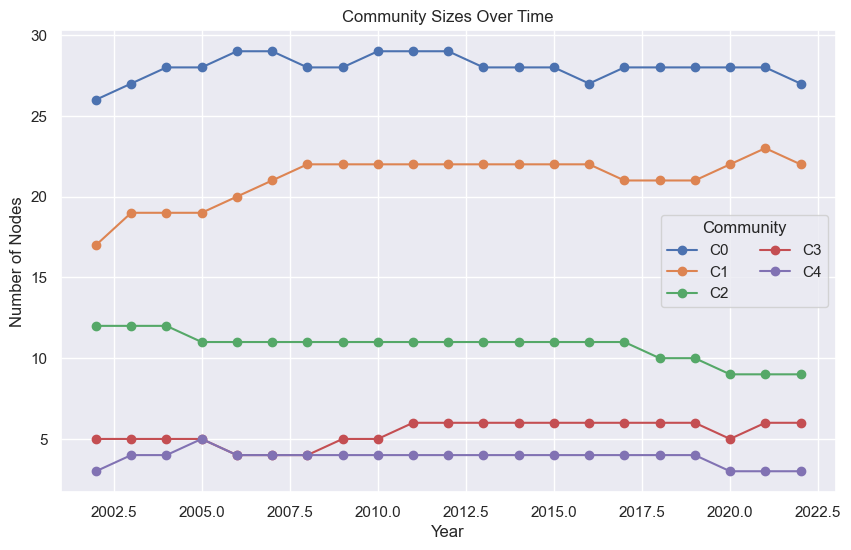

In [36]:
plot_community_sizes_over_time(temporal_membership, years_of_interest)

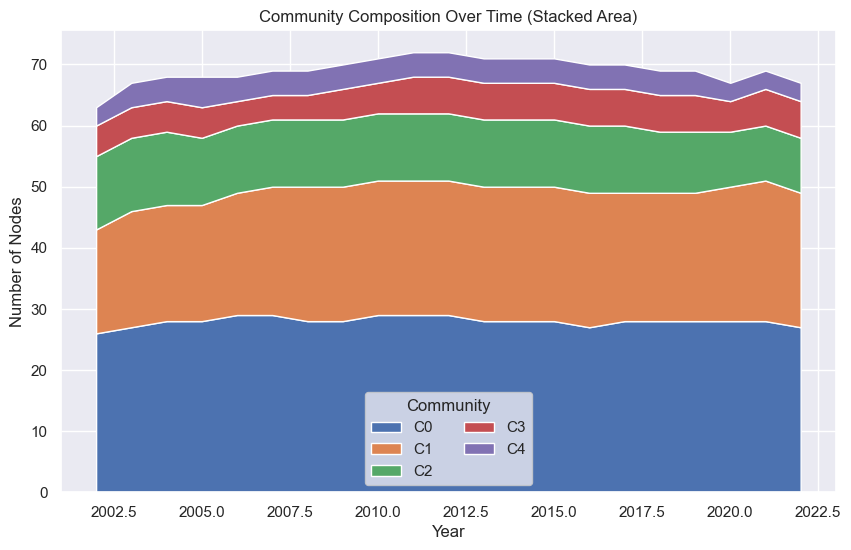

In [37]:
plot_community_stacked_area(temporal_membership, years_of_interest)

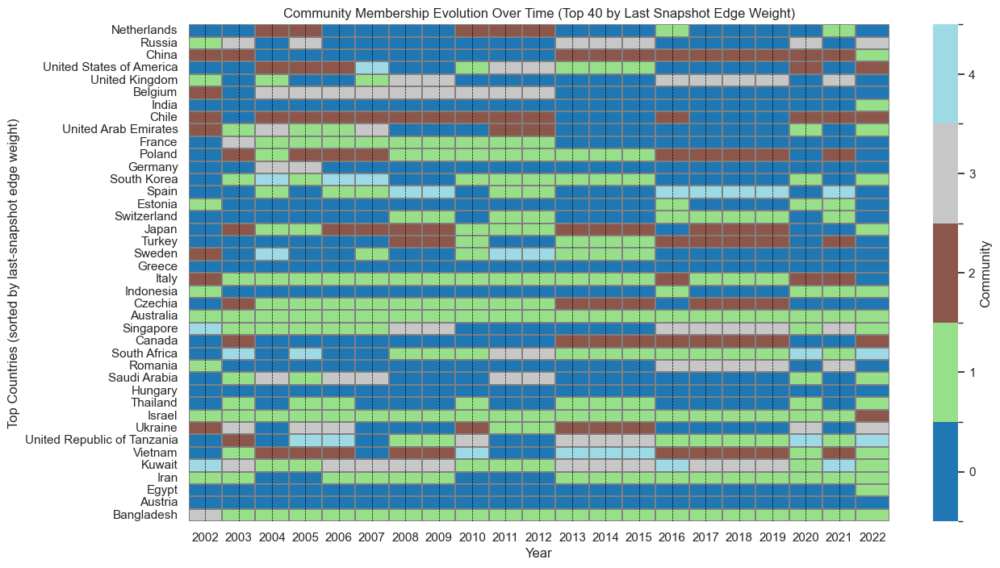

In [38]:
plot_top_countries_heatmap(temporal_membership, snapshots, years_of_interest, top_n=40)

### Block Model

In [39]:
################################################################################
# Device
################################################################################
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cpu


In [40]:
################################################################################
# Node Features
################################################################################
node_features = [
    'avg_gdpcap_exp',
    'avg_gdpcap_imp',
    'wto_member',
    'eu_member',
    'avg_pop'
]

################################################################################
# Volume for adjacency building
################################################################################
edge_feature_cols = [
    "q"
]

In [41]:
################################################################################
# Helper Functions
################################################################################
def filter_top_countries(df: pd.DataFrame, top_percent: float = 0.5):
    exp_sum = df.groupby('export_country')['v'].sum()
    imp_sum = df.groupby('import_country')['v'].sum()
    total_trade = exp_sum.add(imp_sum, fill_value=0).sort_values(ascending=False)
    cutoff_index = int(len(total_trade)*top_percent)
    cutoff_countries = total_trade.index[:cutoff_index]
    df_filtered = df[
        df['export_country'].isin(cutoff_countries) &
        df['import_country'].isin(cutoff_countries)
    ].copy()
    return df_filtered

def compute_total_trade_volume(df: pd.DataFrame):
    grouped = df.groupby(['t', 'export_country', 'import_country'], as_index=False)['v'].sum()
    grouped.rename(columns={'v': 'total_trade_v'}, inplace=True)
    df = df.merge(grouped, on=['t','export_country','import_country'], how='left')
    df['total_trade_v'] = df['total_trade_v'].fillna(0.0)
    return df

def build_node_df(df, all_countries):
    node_df = pd.DataFrame(index=all_countries)
    node_df['avg_gdpcap_exp'] = df.groupby('export_country')['gdpcap_d'].mean()
    node_df['avg_gdpcap_imp'] = df.groupby('import_country')['gdpcap_o'].mean()

    wto_members = set(df[df['wto_o'] == 1]['export_country']) | set(df[df['wto_d'] == 1]['import_country'])
    eu_members = set(df[df['eu_o'] == 1]['export_country']) | set(df[df['eu_d'] == 1]['import_country'])

    node_df['wto_member'] = node_df.index.map(lambda c: 1.0 if c in wto_members else 0.0)
    node_df['eu_member'] = node_df.index.map(lambda c: 1.0 if c in eu_members else 0.0)
    node_df['avg_pop'] = df.groupby('export_country')['pop_o'].mean()

    node_df = node_df.fillna(0.0)
    for c in all_countries:
        if c not in node_df.index:
            node_df.loc[c] = [0,0,0,0,0]
    return node_df

### Blockmodel Communities

In [42]:
def concor_pass(matrix: np.ndarray):
    matrix_centered = matrix - matrix.mean(axis=1, keepdims=True)
    avg_row = matrix_centered.mean(axis=0)
    corr_vals = []
    for row in matrix_centered:
        denom = np.linalg.norm(row)*np.linalg.norm(avg_row)
        if denom < 1e-12:
            corr_vals.append(0.0)
        else:
            corr_vals.append(np.dot(row, avg_row)/denom)
    corr_vals = np.array(corr_vals)
    signs = np.where(corr_vals >= 0, 1, -1)
    return signs

def multi_pass_concor_iter(matrix: np.ndarray, max_passes=5, tol=1e-3):
    prev_signs = None
    for _ in range(max_passes):
        cur_signs = concor_pass(matrix)
        if prev_signs is not None:
            diff = np.mean(cur_signs != prev_signs)
            if diff < tol:
                break
        prev_signs = cur_signs
    return cur_signs

def recursive_concor(matrix: np.ndarray, depth: int = 2, max_passes=5):
    N = matrix.shape[0]
    labels = np.zeros(N, dtype=int)

    def split_indices(idxs, current_label, level):
        if level == depth or len(idxs) <= 1:
            for idx in idxs:
                labels[idx] = current_label
            return

        submat = matrix[idxs, :]
        signs = multi_pass_concor_iter(submat, max_passes=max_passes)
        group1 = idxs[signs >= 0]
        group2 = idxs[signs < 0]

        if len(group1) == 0 or len(group2) == 0:
            for idx in idxs:
                labels[idx] = current_label
            return

        for idx in group1:
            labels[idx] = current_label
        next_label = labels.max() + 1
        for idx in group2:
            labels[idx] = next_label

        split_indices(group1, current_label, level+1)
        split_indices(group2, next_label, level+1)

    all_i = np.arange(N)
    split_indices(all_i, 0, 0)
    return labels

def blockmodel_communities(ig_graph: ig.Graph, depth: int = 2):
    A = np.array(ig_graph.get_adjacency(attribute="weight").data, dtype=float)
    A = np.nan_to_num(A, nan=0.0)
    membership = recursive_concor(A, depth=depth, max_passes=5)
    return membership

################################################################################
# Plot Heatmap of Top Countries
################################################################################
def plot_top_countries_heatmap(temporal_membership, snapshots, years_of_interest, top_n=30):
    node_to_country = {}
    for snapshot in snapshots:
        for v in snapshot.vs:
            node_to_country[v.index] = v["_nx_name"]

    v_attr = "weight"
    last_snapshot = snapshots[-1]
    node_weights = {}
    if last_snapshot.ecount() > 0:
        for e in last_snapshot.es:
            w = e[v_attr] if v_attr in last_snapshot.edge_attributes() else 0.0
            s = e.source
            t = e.target
            node_weights[s] = node_weights.get(s, 0.0) + w
            node_weights[t] = node_weights.get(t, 0.0) + w

    most_relevant_nodes = sorted(node_weights, key=node_weights.get, reverse=True)[:top_n]
    most_relevant_countries = [node_to_country[n] for n in most_relevant_nodes]
    idx_map = {node: i for i, node in enumerate(most_relevant_nodes)}

    num_slices = len(temporal_membership)
    mat = np.full((len(most_relevant_nodes), num_slices), -1)
    for t, mem in enumerate(temporal_membership):
        for node_id, comm in enumerate(mem):
            if node_id in idx_map:
                row = idx_map[node_id]
                mat[row, t] = comm

    unique_comms = np.unique(mat[mat >= 0])
    unique_comms = np.sort(unique_comms)

    from matplotlib.colors import BoundaryNorm
    base_cmap = plt.cm.get_cmap("tab20", len(unique_comms))
    boundaries = np.arange(len(unique_comms) + 1) - 0.5
    norm = BoundaryNorm(boundaries, base_cmap.N)

    plt.figure(figsize=(20,14))
    masked_data = np.ma.masked_where(mat < 0, mat)

    ax = sns.heatmap(
        masked_data,
        cmap=base_cmap,
        norm=norm,
        cbar_kws={"label": "Blockmodel Community"},
        xticklabels=years_of_interest,
        yticklabels=most_relevant_countries,
        linewidths=0.1,
        linecolor="gray"
    )
    plt.xlabel("Year")
    plt.ylabel("Top Countries (by weight in last snapshot)")
    plt.title("Blockmodel Communities Over Time")

    cbar = ax.collections[0].colorbar
    cbar.set_ticks(np.arange(len(unique_comms)))
    cbar.set_ticklabels(unique_comms)

    for t in range(num_slices - 1):
        plt.axvline(t+0.5, color="black", linestyle="--", linewidth=0.5)

    plt.tight_layout()
    plt.show()

################################################################################
# Build Snapshots & Detect Communities (Only "q" used for adjacency!)
################################################################################
def run_blockmodel_community_detection(
    df: pd.DataFrame,
    start_year: int,
    end_year: int,
    top_percent: float,
    edge_volume_threshold: float,
    log_transform: bool,
    window_size: int = 1,
    depth: int = 2
):
    df = filter_top_countries(df, top_percent=top_percent)

    df = compute_total_trade_volume(df)

    years = sorted(df['t'].unique())
    years_of_interest = [y for y in years if start_year <= y <= end_year]
    if len(years_of_interest) < 1:
        raise ValueError("No valid years after filtering.")

    all_countries = np.union1d(df['export_country'].unique(), df['import_country'].unique())

    snapshots = []
    temporal_membership = []

    for y in years_of_interest:
        start_yr = max(df['t'].min(), y - window_size + 1)
        df_window = df[(df['t'] >= start_yr) & (df['t'] <= y)].copy()

        df_window['yearly_total_v'] = df_window.groupby('t')['v'].transform('sum')
        df_window['v'] = df_window['v'] / (df_window['yearly_total_v'] + 1e-9)
        if log_transform:
            df_window['v'] = np.log1p(df_window['v'])

        _ = build_node_df(df_window, all_countries)

        df_window["q"] = pd.to_numeric(df_window["q"], errors='coerce').fillna(0.0)

        scaler = MinMaxScaler()
        q_vals = df_window[["q"]].values
        q_vals_scaled = scaler.fit_transform(q_vals)

        mask = q_vals_scaled[:, 0] > edge_volume_threshold
        df_window = df_window[mask]
        q_vals_scaled = q_vals_scaled[mask]

        ig_graph = ig.Graph()
        ig_graph.add_vertices(len(all_countries))
        ig_graph.vs["name"] = [str(c) for c in all_countries]
        ig_graph.vs["_nx_name"] = list(all_countries)

        if len(df_window) > 0:
            edges_dict = {}
            country_to_id = {c: i for i, c in enumerate(all_countries)}
            for (scaled_val, row) in zip(q_vals_scaled, df_window.itertuples()):
                s = country_to_id[row.export_country]
                t = country_to_id[row.import_country]
                edges_dict[(s, t)] = edges_dict.get((s, t), 0.0) + scaled_val[0]

            edge_list = list(edges_dict.keys())
            weights = list(edges_dict.values())
            ig_graph.add_edges(edge_list)
            ig_graph.es["weight"] = weights

        snapshots.append(ig_graph)

    for ig_graph in snapshots:
        if ig_graph.ecount() == 0:
            membership = [0]*ig_graph.vcount()
        else:
            membership = blockmodel_communities(ig_graph, depth=depth)
        temporal_membership.append(membership)

    return {
        'all_countries': all_countries,
        'years_of_interest': years_of_interest,
        'temporal_membership': temporal_membership,
        'snapshots': snapshots
    }

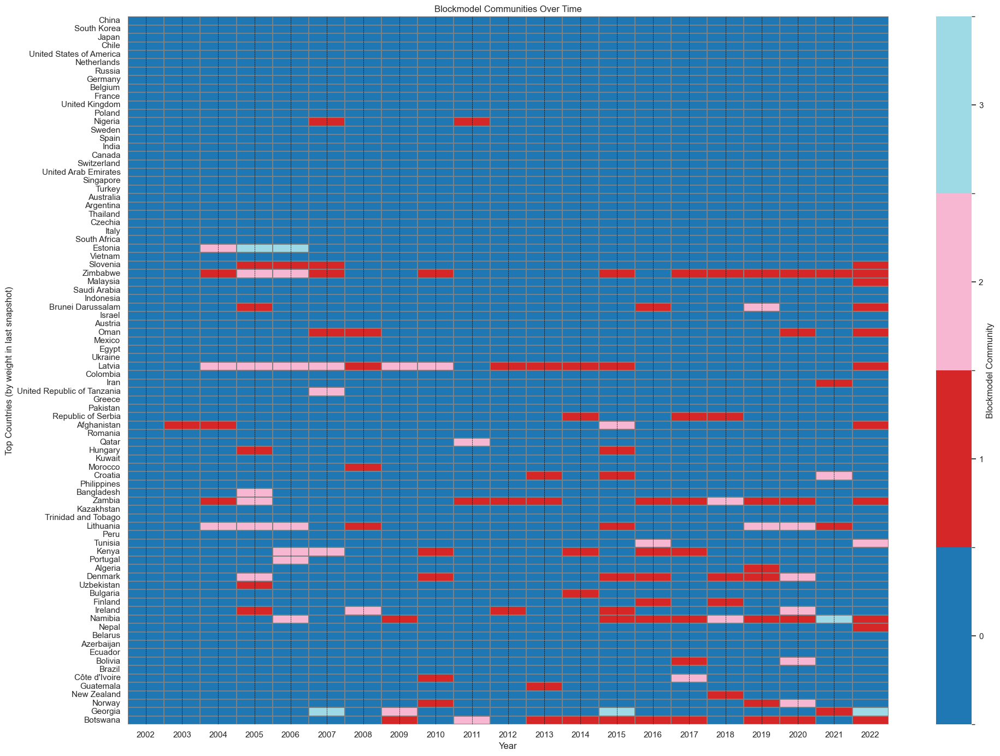

In [43]:
################################################################################
# Parameters
################################################################################
start_year = 2002
end_year = 2022
top_percent = 0.5
edge_volume_threshold = 0
log_transform = True
window_size = 1
depth = 4

results = run_blockmodel_community_detection(
    df=df,
    start_year=start_year,
    end_year=end_year,
    top_percent=top_percent,
    edge_volume_threshold=edge_volume_threshold,
    log_transform=log_transform,
    window_size=window_size,
    depth=depth
)

temporal_membership = results["temporal_membership"]
snapshots = results["snapshots"]
years_of_interest = results["years_of_interest"]
all_countries = results["all_countries"]

plot_top_countries_heatmap(temporal_membership, snapshots, years_of_interest, top_n=100)